# JBFG Data Analysis Competition

### PC Environment and Library Version

In [65]:
#!pip install watermark

%load_ext watermark
%watermark -a 'DataLine' -nmv --packages numpy,pandas,plotly,matplotlib,seaborn,missingno,imblearn,sklearn,lightgbm,xgboost,tensorflow

### 데이터 로딩 - !!! 평가자님 이곳에 데이터 넣어주세요 !!!

In [66]:
import pandas as pd

# 경진대회를 위해 주최측에서 제공한 데이터(EDA 및 ML 학습을 위한 데이터)
# -----------------------------------------------------------------
bank_churner_df = pd.read_csv("../0.data/bank_churner.csv")


# 평가를 위한 데이터 로드 - 평가자님 평가데이터 경로를 입력해 주세요!!! - 평가 결과는 평가결과 출력을 확인
# ------------------------------------------------------------------------------------------------
# eval_churner_df = pd.read_csv("./0.data/test_churner.csv")

## 탐색적 데이터 분석(EDA)
***

### Library and Data Loading, Function Definition

#### Import Library for Data Analysis

In [67]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl  
import missingno as msno
import warnings

import plotly.express as px
import plotly.graph_objs as go
# import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()


warnings.filterwarnings('ignore')
sns.set_theme(style="whitegrid")
%matplotlib inline

mpl.rc('font', family='Malgun Gothic')  # 한글 폰트 설정
                                        # 윈도우 폰트 위치 - C:\Windows\Fonts
plt.figure(figsize=(10,6))              # 그래프 사이즈 설정
sns.set(font='Malgun Gothic', rc={'axes.unicode_minus':False}, style='darkgrid') # 마이너스 처리


<Figure size 720x432 with 0 Axes>

In [68]:
bank_churner_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8101 entries, 0 to 8100
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             8101 non-null   int64  
 1   cstno                  8101 non-null   int64  
 2   is_churned             8101 non-null   int64  
 3   age                    8101 non-null   int64  
 4   sex                    7293 non-null   object 
 5   dependent_num          8101 non-null   int64  
 6   education              8101 non-null   object 
 7   marital_stat           8101 non-null   object 
 8   imcome_cat             6482 non-null   object 
 9   card_type              8101 non-null   object 
 10  mon_on_book            8101 non-null   int64  
 11  tot_product_count      8101 non-null   int64  
 12  months_inact_for_12m   8101 non-null   int64  
 13  contact_cnt_for_12m    8101 non-null   int64  
 14  credit_line            8101 non-null   float64
 15  tot_

### Function Definition

#### print_continuous_graphs()
* 연속형 데이터 그래프 함수

In [69]:
def print_continuous_graphs(df, column, column_desc):

    mean_df = df.groupby([column, 'is_churned'])[['tot_trans_amt_for_12m', 'tot_trans_cnt_for_12m']].agg(lambda x: x.mean())
    mean_df.reset_index(inplace=True)

    mean_tot_df = df.groupby([column])[['tot_trans_amt_for_12m', 'credit_line', 'tot_revol_balance', 'mean_open_to_buy', 'tot_trans_cnt_for_12m', 'mean_util_pct', 'contact_cnt_for_12m']].agg(lambda x: x.mean())
    mean_tot_df.reset_index(inplace=True)
    
    
    counts = df[column].value_counts() # 해당 컬럼의 속성별 합계
    exist_counts = df[df['is_churned'] == 0][column].value_counts() # 유지 - 해당 컬럼의 속성별 합계
    churn_counts = df[df['is_churned'] == 1][column].value_counts() # 이탈 - 해당 컬럼의 속성별 합계
    churn_rates = churn_counts / counts # 해당 컴럼의 속성별 이탈율    

    fig = make_subplots(rows=2, 
                        cols=2, 
                        subplot_titles=('【 고객 분포 】', '【 사분위 】', '【 금액별 현황 】', '【 거래건수/접속회수/한도소진율 】'), 
                        # shared_xaxes=True,
                        horizontal_spacing=0.1,
                        vertical_spacing=0.1,
                        specs=[[{'secondary_y': True}, {}],
                            [{'secondary_y': True}, {'secondary_y': True}],
                            ])


    # 전체
    # ----
    fig.add_trace(go.Histogram(x=df[df['is_churned'] == 1][column].sort_values(), marker_color="red", name='이탈', offsetgroup=0, showlegend=True), row=1, col=1, secondary_y=False)
    fig.add_trace(go.Histogram(x=df[df['is_churned'] == 0][column].sort_values(), marker_color="blue", name='유지', 
                               offsetgroup=0,  
                               showlegend=True), row=1, col=1, secondary_y=False)
    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), hovertemplate='%{y:.2f}', 
                             marker_color="green", name='이탈율', line_shape='linear', mode='lines+markers'), row=1, col=1, secondary_y=True)
    

    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=1, col=1)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=1, col=1)
    fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=1, col=1)


    # 사분위 그래프
    # ------------
    fig.add_trace(go.Box(x=df[df['is_churned']==0][column].sort_values(), name='유지', marker_color="blue", showlegend=False), row=1, col=2)
    fig.add_trace(go.Box(x=df[df['is_churned']!=0][column].sort_values(), name='이탈', marker_color="red", showlegend=False), row=1, col=2)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=1, col=2)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', row=1, col=2)


    # 금액단위 종합 현황(line Graph)
    # -----------------------------
    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['tot_trans_amt_for_12m'].sort_index(), name='사용금액', 
                             line_shape='linear',
                            #  text=mean_tot_df['tot_trans_amt_for_12m'].sort_index(),
                            #  texttemplate='%{text:$,.0f}', 
                            #  textposition='top center',
                             mode='lines+markers',
                             hovertemplate = '%{y:$,.2f}', 
                             showlegend=True), row=2, col=1)

    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['credit_line'].sort_index(), name='신용한도', 
                             line_shape='linear',
                            #  text=mean_tot_df['credit_line'].sort_index(),
                            #  texttemplate='%{text:$,.0f}', 
                            #  textposition='top center',
                             mode='lines+markers',
                             hovertemplate = '%{y:$,.2f}', 
                             showlegend=True), row=2, col=1)

    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['tot_revol_balance'].sort_index(), name='리볼빙 잔액', 
                             line_shape='linear',
                            #  text=mean_tot_df['tot_revol_balance'].sort_index(),
                            #  texttemplate='%{text:$,.0f}', 
                            #  textposition='top center',
                             mode='lines+markers',
                             hovertemplate = '%{y:$,.2f}', 
                             showlegend=True), row=2, col=1)

    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['mean_open_to_buy'].sort_index(), name='사용가능 신용한도', 
                             line_shape='linear',
                            #  text=mean_tot_df['mean_open_to_buy'].sort_index(),
                            #  texttemplate='%{text:$,.0f}', 
                            #  textposition='top center',
                             mode='lines+markers',
                             hovertemplate = '%{y:$,.2f}', 
                             showlegend=True), row=2, col=1)


    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", mode='lines+markers', name='이탈율', 
                             line_shape='linear',
                            #  text=churn_rates.sort_index(),                             
                            #  texttemplate='%{text:.2f}', 
                            #  textposition='top center',
                            #  mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=2, col=1, secondary_y=True)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=2, col=1)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=2, col=1)
    fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=2, col=1)

       
    # 거래 건수/연락 횟수/한도 소진율
    # -----------------------------
    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['tot_trans_cnt_for_12m'].sort_index(), name='거래건수', 
                             line_shape='linear',
                            #  text=mean_tot_df['tot_trans_amt_for_12m'].sort_index(),
                            #  texttemplate='%{text:$,.0f}', 
                            #  textposition='top center',
                             mode='lines+markers',
                             hovertemplate = '%{y:,.0f}', 
                             showlegend=True), row=2, col=2)

    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['contact_cnt_for_12m'].sort_index(), name='연락횟수', 
                             line_shape='linear',
                            #  text=mean_tot_df['tot_trans_amt_for_12m'].sort_index(),
                            #  texttemplate='%{text:$,.0f}', 
                            #  textposition='top center',
                             mode='lines+markers',
                             hovertemplate = '%{y:,.0f}', 
                             showlegend=True), row=2, col=2)

    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['mean_util_pct'].sort_index(), name='한도 소진율', 
                             line_shape='linear',
                            #  text=churn_rates.sort_index(),                             
                            #  texttemplate='%{text:.2f}', 
                            #  textposition='top center',
                             mode='lines+markers',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=True), row=2, col=2, secondary_y=True)
    
    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
                             line_shape='linear',
                            #  text=churn_rates.sort_index(),                             
                            #  texttemplate='%{text:.2f}', 
                            #  textposition='top center',
                             mode='lines+markers',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=2, col=2, secondary_y=True)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=2, col=1)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=2, col=2)
    fig.update_yaxes(secondary_y=True, range=[0, 0.7], row=2, col=2)
    

    fig.update_layout(width=1400, 
                    height=900, 
                    margin_l=50,
                    margin_r=0, 
                    margin_b=50,
                    margin_t=130,
                    barmode='stack',
                    hovermode="x",
                    template='plotly_dark',
                    
    )
                    
    fig.update_layout(title_x = 0.5,
                    title_y = 0.98,
                    title_xanchor = "center",
                    title_yanchor = "middle",
                    title_font_size = 25,
                    title_text=f'『 {column_desc} 』에 따른 분석 그래프',
                    )
    
    fig.update_layout(legend=dict(
        orientation="h",
        x=0,
        y=1.05,
        xanchor="left",
        yanchor="bottom",
        # traceorder="reversed",
        # bgcolor="LightSteelBlue",
        # bordercolor="Black",
        bordercolor="White",        
        borderwidth=2,
        font=dict(
        family="Courier",
        size=14,
        # color="black"
        color="white"            
        ),
    ))    
    
    fig.show()

#### print_category_graphs()
* 범주형 데이터 그래프 함수

In [70]:
def print_category_graphs(df, column, column_desc):
  
    mean_df = df.groupby([column, 'is_churned'])[['tot_trans_amt_for_12m', 'credit_line', 'tot_revol_balance', 'mean_open_to_buy', 'tot_trans_cnt_for_12m', 'mean_util_pct', 'contact_cnt_for_12m']].agg(lambda x: x.mean())
    mean_df.reset_index(inplace=True)

    mean_tot_df = df.groupby([column])[['tot_trans_amt_for_12m', 'credit_line', 'tot_revol_balance', 'mean_open_to_buy', 'tot_trans_cnt_for_12m', 'mean_util_pct', 'contact_cnt_for_12m']].agg(lambda x: x.mean())
    mean_tot_df.reset_index(inplace=True)
    
    counts = df[column].value_counts() # 해당 컬럼의 속성별 합계
    exist_counts = df[df['is_churned'] == 0][column].value_counts() # 유지 - 해당 컬럼의 속성별 합계
    churn_counts = df[df['is_churned'] == 1][column].value_counts() # 이탈 - 해당 컬럼의 속성별 합계
    churn_rates = churn_counts / counts # 해당 컴럼의 속성별 이탈율 
    
    
    fig = make_subplots(rows=6, 
                    cols=2, 
                    subplot_titles=('【 고객 분포 현황 】', '【 사분위 】', '【 금액별 현황 】', '【 거래건수/연락횟수/한도소진율 현황 】', '【 평균 사용 금액 】', '【 카드 한도 】', '【 리볼빙 잔액 】', '【 사용가능 신용한도 】', '【 거래 건수 】', '【 한도 소진율 】', '【 연락 횟수 】', '【 전체 고객 분포 현황 】'), 
                    # shared_xaxes=True,
                    # horizontal_spacing=0.1,
                    # vertical_spacing=0.1,
                    horizontal_spacing=0.07,
                    vertical_spacing=0.07,

                    specs=[[{'secondary_y': True}, {}],
                           [{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': True}, {}],
                           [{'secondary_y': True}, {'type':'domain'}],                           
                          #  [{'type':'domain'}, {'type':'domain'}]
                          ]
                   )


    # 고객 분포 현황
    # ---------
    fig.add_trace(go.Bar(x=churn_counts.sort_index().index, y=churn_counts.sort_index(), marker_color="red", offsetgroup=0, name='이탈', 
                         text=churn_counts.sort_index(), texttemplate='%{text:,}', textposition='auto', 
                         hovertemplate = '%{value:,.0f}'), row=1, col=1, secondary_y=False)
    
    
    fig.add_trace(go.Bar(x=exist_counts.sort_index().index, y=exist_counts.sort_index(), marker_color="blue", offsetgroup=0, name='유지', 
                         text=exist_counts.sort_index(),
                         texttemplate='%{text:,}', 
                        #  texttemplate='%{value:,}', 
                        #  texttemplate='%{text:.2s}',
                        #  text=exist_counts.sort_index(), 
                         hovertemplate = '%{value:,}',
                         textposition='auto', 
                         base=churn_counts.sort_index()), row=1, col=1, secondary_y=False)
    
    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율',
                             text=churn_rates.sort_index(),
                             texttemplate='%{text:,.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate='%{y:.2f}', line_shape='linear'), row=1, col=1, secondary_y=True)
    
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=1, col=1)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=1, col=1)
    fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=1, col=1)


    # 사분위
    # ------
    fig.add_trace(go.Box(x=df[df['is_churned']!=0][column].sort_values(), marker_color="red", name='이탈', showlegend=False), row=1, col=2)
    fig.add_trace(go.Box(x=df[df['is_churned']==0][column].sort_values(), marker_color="blue", name='유지', showlegend=False), row=1, col=2)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=1, col=2)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', row=1, col=2)


    # 금액단위 종합 현황(line Graph)
    # -----------------------------
    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['tot_trans_amt_for_12m'].sort_index(), name='사용금액', 
                             line_shape='linear',
                             text=mean_tot_df['tot_trans_amt_for_12m'].sort_index(),
                             texttemplate='%{text:$,.0f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:$,.2f}', 
                             showlegend=True), row=2, col=1)

    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['credit_line'].sort_index(), name='신용한도', 
                             line_shape='linear',
                             text=mean_tot_df['credit_line'].sort_index(),
                             texttemplate='%{text:$,.0f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:$,.2f}', 
                             showlegend=True), row=2, col=1)

    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['tot_revol_balance'].sort_index(), name='리볼빙 잔액', 
                             line_shape='linear',
                             text=mean_tot_df['tot_revol_balance'].sort_index(),
                             texttemplate='%{text:$,.0f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:$,.2f}', 
                             showlegend=True), row=2, col=1)

    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['mean_open_to_buy'].sort_index(), name='사용가능 신용한도', 
                             line_shape='linear',
                             text=mean_tot_df['mean_open_to_buy'].sort_index(),
                             texttemplate='%{text:$,.0f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:$,.2f}', 
                             showlegend=True), row=2, col=1)


    # fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
                             line_shape='linear',
                             text=churn_rates.sort_index(),                             
                             texttemplate='%{text:.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=2, col=1, secondary_y=True)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=2, col=1)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=2, col=1)
    fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=2, col=1)


    # 거래 건수/연락 횟수/한도 소진율
    # -----------------------------
    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['tot_trans_cnt_for_12m'].sort_index(), name='거래건수', 
                             line_shape='linear',
                             text=mean_tot_df['tot_trans_cnt_for_12m'].sort_index(),
                             texttemplate='%{text:,.0f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:,.0f}', 
                             showlegend=True), row=2, col=2)

    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['contact_cnt_for_12m'].sort_index(), name='연락횟수', 
                             line_shape='linear',
                             text=mean_tot_df['contact_cnt_for_12m'].sort_index(),
                             texttemplate='%{text:,.0f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:,.0f}', 
                             showlegend=True), row=2, col=2)

    fig.add_trace(go.Scatter(x=mean_tot_df[column].sort_index(), y=mean_tot_df['mean_util_pct'].sort_index(), name='한도 소진율', 
                             line_shape='linear',
                             text=mean_tot_df['mean_util_pct'].sort_index(),                                     
                             texttemplate='%{text:.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=True), row=2, col=2, secondary_y=True)
    
    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
                             line_shape='linear',
                             text=churn_rates.sort_index(),                             
                             texttemplate='%{text:.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=2, col=2, secondary_y=True)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=2, col=1)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=2, col=2)
    fig.update_yaxes(secondary_y=True, range=[0, 0.7], row=2, col=2)


    # 평균사용 금액
    # ------------
    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 0][column].sort_index(), y=mean_df[mean_df['is_churned'] == 0]['tot_trans_amt_for_12m'].sort_index(), 
                         marker_color="blue", name='유지고객 평균 사용금액',
                         text=mean_df[mean_df['is_churned'] == 0]['tot_trans_amt_for_12m'], 
                         texttemplate='%{text:$,.0f}', 
                         textposition='auto', 
                         hovertemplate='%{y:$,.0f}',
                         showlegend=False), row=3, col=1, secondary_y=False)

    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 1][column].sort_index(), y=mean_df[mean_df['is_churned'] == 1]['tot_trans_amt_for_12m'].sort_index(), 
                         marker_color="red", name='이탈고객 평균 사용금액', 
                         text=mean_df[mean_df['is_churned'] == 1]['tot_trans_amt_for_12m'], 
                         texttemplate='%{text:$,.0f}', 
                         textposition='auto', 
                         hovertemplate='%{y:$,.0f}',
                         showlegend=False), row=3, col=1, secondary_y=False),
                

    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
                             line_shape='linear',
                             text=churn_rates.sort_index(),                             
                             texttemplate='%{text:.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=3, col=1, secondary_y=True)
    
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=3, col=1)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=3, col=1)
    fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=3, col=1)



    # 카드 한도
    # ---------
    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 0][column].sort_index(), y=mean_df[mean_df['is_churned'] == 0]['credit_line'].sort_index(), 
                         marker_color="blue", name='유지고객 평균 카드한도',
                         text=mean_df[mean_df['is_churned'] == 0]['credit_line'], 
                        #  text=mean_trans_amt[mean_trans_amt['is_churned'] == 0]['tot_trans_amt_for_12m'].sort_index(), 
                         texttemplate='%{text:$,.0f}', 
                         textposition='auto', 
                         hovertemplate='%{y:$,.0f}', 
                         showlegend=False), row=3, col=2, secondary_y=False)

    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 1][column].sort_index(), y=mean_df[mean_df['is_churned'] == 1]['credit_line'].sort_index(), 
                         marker_color="red", name='이탈고객 평균 카드한도', 
                         text=mean_df[mean_df['is_churned'] == 1]['credit_line'], 
                         texttemplate='%{text:$,.0f}', 
                         textposition='auto', 
                         hovertemplate='%{y:$,.0f}',
                         showlegend=False), row=3, col=2, secondary_y=False),

    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
                             line_shape='linear',
                             text=churn_rates.sort_index(),                             
                             texttemplate='%{text:.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=3, col=2, secondary_y=True)
    
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=3, col=2)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=3, col=2)
    fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=3, col=2)

    
    # 리볼빙 잔액
    # ----------
    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 0][column].sort_index(), y=mean_df[mean_df['is_churned'] == 0]['tot_revol_balance'].sort_index(), 
                         marker_color="blue", name='유지고객 평균 리볼빙 잔액',
                         text=mean_df[mean_df['is_churned'] == 0]['tot_revol_balance'], 
                        #  text=mean_trans_amt[mean_trans_amt['is_churned'] == 0]['tot_trans_amt_for_12m'].sort_index(), 
                         texttemplate='%{text:$,.0f}', 
                         textposition='auto', 
                         hovertemplate='%{y:$,.0f}',
                         showlegend=False), row=4, col=1, secondary_y=False)

    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 1][column].sort_index(), y=mean_df[mean_df['is_churned'] == 1]['tot_revol_balance'].sort_index(), 
                         marker_color="red", name='이탈고객 평균 리볼빙 잔액', 
                         text=mean_df[mean_df['is_churned'] == 1]['tot_revol_balance'], 
                         texttemplate='%{text:$,.0f}', 
                         textposition='auto', 
                         hovertemplate='%{y:$,.0f}',
                         showlegend=False), row=4, col=1, secondary_y=False),
                
    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
                             line_shape='linear',
                             text=churn_rates.sort_index(),                             
                             texttemplate='%{text:.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=4, col=1, secondary_y=True)
    
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=4, col=1)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=4, col=1)
    fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=4, col=1)

    
    # 사용가능 신용한도
    # ----------------
    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 0][column].sort_index(), y=mean_df[mean_df['is_churned'] == 0]['mean_open_to_buy'].sort_index(), 
                         marker_color="blue", name='유지고객 평균 신용한도',
                         text=mean_df[mean_df['is_churned'] == 0]['mean_open_to_buy'], 
                         texttemplate='%{text:$,.0f}', 
                         textposition='auto', 
                         hovertemplate='%{y:$,.0f}',
                         showlegend=False), row=4, col=2, secondary_y=False)

    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 1][column].sort_index(), y=mean_df[mean_df['is_churned'] == 1]['mean_open_to_buy'].sort_index(), 
                         marker_color="red",  name='이탈고객 평균 신용한도', 
                         text=mean_df[mean_df['is_churned'] == 1]['mean_open_to_buy'], 
                         texttemplate='%{text:$,.0f}', 
                         textposition='auto', 
                         hovertemplate='%{y:$,.0f}',
                         showlegend=False), row=4, col=2, secondary_y=False),
                

    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
                             line_shape='linear',
                             text=churn_rates.sort_index(),                             
                             texttemplate='%{text:.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=4, col=2, secondary_y=True)
    
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=4, col=2)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=4, col=2)
    fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=4, col=2)


    # 거래 건수
    # --------
    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 0][column].sort_index(), y=mean_df[mean_df['is_churned'] == 0]['tot_trans_cnt_for_12m'].sort_index(), 
                         marker_color="blue", name='유지고객 평균 거래 건수',
                         text=mean_df[mean_df['is_churned'] == 0]['tot_trans_cnt_for_12m'], 
                         texttemplate='%{text:,.0f}', 
                         textposition='auto', 
                         hovertemplate='%{y:,.0f}',
                         showlegend=False), row=5, col=1, secondary_y=False)

    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 1][column].sort_index(), y=mean_df[mean_df['is_churned'] == 1]['tot_trans_cnt_for_12m'].sort_index(), 
                         marker_color="red", name='이탈고객 평균 거래 건수', 
                         text=mean_df[mean_df['is_churned'] == 1]['tot_trans_cnt_for_12m'], 
                         texttemplate='%{text:,.0f}', 
                         textposition='auto', 
                         hovertemplate='%{y:,.0f}',
                         showlegend=False), row=5, col=1, secondary_y=False),
                

    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
                             line_shape='linear',
                             text=churn_rates.sort_index(),                             
                             texttemplate='%{text:.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=5, col=1, secondary_y=True)
    
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=5, col=1)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=5, col=1)
    fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=5, col=1)


    # 한도소진율
    # ---------
    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 0][column].sort_index(), y=mean_df[mean_df['is_churned'] == 0]['mean_util_pct'].sort_index(), 
                         marker_color="blue", name='유지고객 평균 한도소진율',
                         text=mean_df[mean_df['is_churned'] == 0]['mean_util_pct'], 
                        #  text=mean_trans_amt[mean_trans_amt['is_churned'] == 0]['tot_trans_amt_for_12m'].sort_index(), 
                         texttemplate='%{text:.2f}', 
                         textposition='auto', 
                         hovertemplate='%{y:.2f}',
                         showlegend=False), row=5, col=2)

    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 1][column].sort_index(), y=mean_df[mean_df['is_churned'] == 1]['mean_util_pct'].sort_index(), 
                         marker_color="red", name='이탈고객 평균 한도소진율', 
                         text=mean_df[mean_df['is_churned'] == 1]['mean_util_pct'], 
                         texttemplate='%{text:.2f}', 
                         textposition='auto', 
                         hovertemplate='%{y:.2f}',
                         showlegend=False), row=5, col=2),
                

    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
                             line_shape='linear',
                             text=churn_rates.sort_index(),                             
                             texttemplate='%{text:.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=5, col=2)
    
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=5, col=2)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', row=5, col=2)
    # fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=4, col=2)


    # 연락 횟수
    # --------
    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 0][column].sort_index(), y=mean_df[mean_df['is_churned'] == 0]['contact_cnt_for_12m'].sort_index(), 
                         marker_color="blue", name='유지고객 평균 연락 횟수',
                         text=mean_df[mean_df['is_churned'] == 0]['contact_cnt_for_12m'], 
                         texttemplate='%{text:,.1f}', 
                         textposition='auto', 
                         hovertemplate='%{y:$,.1f}',
                         showlegend=False), row=6, col=1, secondary_y=False)

    fig.add_trace(go.Bar(x=mean_df[mean_df['is_churned'] == 1][column].sort_index(), y=mean_df[mean_df['is_churned'] == 1]['contact_cnt_for_12m'].sort_index(), 
                         marker_color="red", name='이탈고객 평균 연락 횟수', 
                         text=mean_df[mean_df['is_churned'] == 1]['contact_cnt_for_12m'], 
                         texttemplate='%{text:,.1f}', 
                         textposition='auto', 
                         hovertemplate='%{y:,.1f}',
                         showlegend=False), row=6, col=1, secondary_y=False),
                

    fig.add_trace(go.Scatter(x=churn_rates.sort_index().index, y=churn_rates.sort_index(), marker_color="green", name='이탈율', 
                             line_shape='linear',
                             text=churn_rates.sort_index(),                             
                             texttemplate='%{text:.2f}', 
                             textposition='top center',
                             mode='lines+markers+text',
                             hovertemplate = '%{y:.2f}', 
                             showlegend=False), row=6, col=1, secondary_y=True)
    
    fig.update_xaxes(showline=True, linewidth=1, linecolor='white', row=6, col=1)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='white', secondary_y=False, row=6, col=1)
    fig.update_yaxes(secondary_y=True, range=[0, 0.5], row=6, col=1)


    # 고객 전체 분포 현황
    # -----------------
    fig.add_trace(go.Pie(labels=counts.sort_index().index, values=counts.sort_index(), name=f'{column_desc} 분포 현황', texttemplate = "%{label}: %{value:,} <br>(%{percent})", showlegend=False,
                         textposition = "inside"), row=6, col=2)
    fig.update_traces(hole=.4, hoverinfo="label+percent+name", row=6, col=2)


    fig.update_layout(width=1200, 
                    height=1600, 
                    margin_l=50,
                    margin_r=0, 
                    margin_b=50,
                    margin_t=140,
                    # barmode='stack',
                    hovermode="x",
                    template='plotly_dark',
                    
    )
                    
    fig.update_layout(title_x = 0.5,
                    title_y = 0.98,
                    title_xanchor = "center",
                    title_yanchor = "middle",
                    title_font_size = 25,
                    title_text=f'『 {column_desc} 』에 따른 분석 그래프',
                    )
    
    fig.update_layout(legend=dict(
        orientation="h",
        x=0,
        y=1.03,
        xanchor="left",
        yanchor="bottom",
        # traceorder="reversed",
        # bgcolor="LightSteelBlue",
        # bordercolor="Black",
        bordercolor="White",        
        borderwidth=2,
        font=dict(
        family="Courier",
        size=14,
        # color="black"
        color="white"            
        ),
    ))    

    fig.show()    

#### change_categorical_data()
* 연속형 데이터를 범주형 데이터로 변환

In [71]:
def change_categorical_data(df, column, start_value, units):
    bins = np.arange(start_value, df[column].max()+units, units)
    # bins_label = [str(round(x,2)) for x in bins]
    bins_label = [str(int(round(x,2)) if round(x,2) > 3 else round(x,2)) for x in bins]
    df[f"{column}_category"] = pd.cut(df[column], bins, right=True, include_lowest=True, labels=bins_label[:-1])

    return df

#### change_format()
* 데이터 소수점 및 100분율 표시

In [72]:

def change_format(df, column, format):
    if format == 'comma':
        df[column] = df[column].apply(lambda x: f"{x:,}")
    elif format == 'percent':
        df[column] = df[column].apply(lambda x: f"{x:.2%}")
        
    return df

#### count_column_na_count()
* 컬럼 데이터 및 Null 건수 확인

In [73]:
def count_column_na_count(df, column):
    '''
    '''
    column_na_counts = df[column].size, df[column].count(), df[column].isnull().sum()
    column_na_counts_df = pd.Series(column_na_counts).to_frame().T
    column_na_counts_df.columns = ['tot_counts', 'data_counts', 'null_counts']
    column_na_counts_df['data_percents'] = column_na_counts_df['data_counts'].values/column_na_counts_df['tot_counts'].values
    column_na_counts_df['null_percents'] = column_na_counts_df['null_counts'].values/column_na_counts_df['tot_counts'].values


    column_na_counts_df = change_format(column_na_counts_df, 'tot_counts', 'comma')
    column_na_counts_df = change_format(column_na_counts_df, 'data_counts','comma')
    column_na_counts_df = change_format(column_na_counts_df, 'null_counts','comma')
    column_na_counts_df = change_format(column_na_counts_df, 'data_percents', 'percent')
    column_na_counts_df = change_format(column_na_counts_df, 'null_percents', 'percent')

    print(column_na_counts_df.to_string(index=False))
    print('-'*70)


def count_column_data_count(df, column):
    ''' 
    '''
    # column_data_countcounts = df.groupby(column)['is_churned'].value_counts().unstack()


    column_counts = df.groupby(column)['is_churned'].value_counts().unstack()
    column_counts = column_counts.rename(columns={0: 'exist_counts', 1: 'churned_counts'})
    column_counts['total_counts'] =  column_counts['exist_counts'] + column_counts['churned_counts']
    column_counts = column_counts.fillna(0)

    column_percents = df.groupby(column)['is_churned'].value_counts(normalize=True).unstack()
    column_percents = column_percents.rename(columns={0: 'exist_percents', 1: 'churned_percents'})
    column_percents = column_percents.fillna(0)


    column_count_percent = pd.concat([column_counts, column_percents], axis=1)
    column_count_percent = column_count_percent.reset_index()
    column_count_percent = column_count_percent.sort_values(by='churned_percents', ascending=False)

    
    column_count_percent = change_format(column_count_percent, 'exist_counts', 'comma')
    column_count_percent = change_format(column_count_percent, 'churned_counts', 'comma')
    column_count_percent = change_format(column_count_percent, 'total_counts', 'comma')
    column_count_percent = change_format(column_count_percent, 'exist_percents', 'percent')
    column_count_percent = change_format(column_count_percent, 'churned_percents', 'percent')
    

    print(column_count_percent.to_string(index=False))

#### tot_column_counts()
* 컬럼별 건수 및 널 분포 현황 출력

In [74]:
def tot_column_counts(df):
    ''' 
    '''
    data_counts = df.count()
    null_counts = df.isnull().sum()
    tot_counts_df = pd.concat([data_counts, null_counts], axis=1)
    tot_counts_df = tot_counts_df.rename(columns={0: 'data_counts', 1: 'null_counts'})
    tot_counts_df.insert(0,'tot_counts', tot_counts_df['data_counts'] + tot_counts_df['null_counts'])
    tot_counts_df['data_percents'] = tot_counts_df['data_counts'].values / tot_counts_df['tot_counts'].values
    tot_counts_df['null_percents'] = tot_counts_df['null_counts'].values / tot_counts_df['tot_counts'].values
    tot_counts_df = tot_counts_df.sort_values(by='null_percents', ascending=False)

    tot_counts_df = change_format(tot_counts_df, 'tot_counts', 'comma')
    tot_counts_df = change_format(tot_counts_df, 'data_counts','comma')
    tot_counts_df = change_format(tot_counts_df, 'null_counts','comma')
    tot_counts_df = change_format(tot_counts_df, 'data_percents', 'percent')
    tot_counts_df = change_format(tot_counts_df, 'null_percents', 'percent')

    tot_counts_df = tot_counts_df.reset_index()

    print(tot_counts_df.to_string(index=False))
    

### Data Loading

In [75]:
eda_churner_df = bank_churner_df.copy()

### 분석 데이터 개략 확인
***

#### 데이터 세트 정보 확인
* 일부 Feature에 Null 값 존재함을 확인 함
* 향후 모델학습시 Null 값 처리에 대한 필요성 확인 함
* 모델학습을 의해 Oject 항목을 적절하게 변형할 필요성을 확인 함
    * sex, education, marital_stat, imcome_cat, card_type (5개 Features) 

In [76]:
eda_churner_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8101 entries, 0 to 8100
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             8101 non-null   int64  
 1   cstno                  8101 non-null   int64  
 2   is_churned             8101 non-null   int64  
 3   age                    8101 non-null   int64  
 4   sex                    7293 non-null   object 
 5   dependent_num          8101 non-null   int64  
 6   education              8101 non-null   object 
 7   marital_stat           8101 non-null   object 
 8   imcome_cat             6482 non-null   object 
 9   card_type              8101 non-null   object 
 10  mon_on_book            8101 non-null   int64  
 11  tot_product_count      8101 non-null   int64  
 12  months_inact_for_12m   8101 non-null   int64  
 13  contact_cnt_for_12m    8101 non-null   int64  
 14  credit_line            8101 non-null   float64
 15  tot_

#### 수치 데이터의 분포값 개략 확인

In [77]:
eda_churner_df.describe()

,Unnamed: 0,cstno,is_churned,age,dependent_num,mon_on_book,tot_product_count,months_inact_for_12m,contact_cnt_for_12m,credit_line,tot_revol_balance,mean_open_to_buy,tot_amt_ratio_q4_q1,tot_trans_amt_for_12m,tot_trans_cnt_for_12m,tot_cnt_ratio_q4_q1,mean_util_pct
count,8101.000000,8.101000e+03,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,6580.000000,8101.000000,5666.000000,6432.000000,4851.000000,6472.000000,5575.000000
mean,4050.000000,7.391329e+08,0.160474,46.306382,2.334773,35.923590,3.813233,2.346871,2.450315,8636.548068,1158.693313,7476.165276,0.761457,4438.785448,64.568336,0.709951,0.274055
std,2338.701598,3.691912e+07,0.367068,8.022527,1.289564,8.024359,1.551838,1.014177,1.100687,9086.419557,814.653118,9080.279910,0.217645,3451.913558,23.659213,0.234484,0.275833
min,0.000000,7.080821e+08,0.000000,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,11.000000,0.000000,0.000000
25%,2025.000000,7.130534e+08,0.000000,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,324.750000,1341.000000,0.631000,2152.750000,44.500000,0.581000,0.023000
50%,4050.000000,7.178860e+08,0.000000,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1272.000000,3495.000000,0.739000,3905.000000,67.000000,0.700000,0.175000
75%,6075.000000,7.728464e+08,0.000000,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11128.000000,1777.250000,9942.000000,0.862000,4754.250000,80.000000,0.818000,0.501000
max,8100.000000,8.283431e+08,1.000000,70.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,2.594000,18484.000000,139.000000,3.571000,0.999000


#### 결측치 확인 및 시각화

In [78]:
tot_column_counts(eda_churner_df)

                 index tot_counts data_counts null_counts data_percents null_percents
 tot_trans_cnt_for_12m      8,101       4,851       3,250        59.88%        40.12%
         mean_util_pct      8,101       5,575       2,526        68.82%        31.18%
   tot_amt_ratio_q4_q1      8,101       5,666       2,435        69.94%        30.06%
 tot_trans_amt_for_12m      8,101       6,432       1,669        79.40%        20.60%
   tot_cnt_ratio_q4_q1      8,101       6,472       1,629        79.89%        20.11%
            imcome_cat      8,101       6,482       1,619        80.01%        19.99%
     tot_revol_balance      8,101       6,580       1,521        81.22%        18.78%
                   sex      8,101       7,293         808        90.03%         9.97%
  months_inact_for_12m      8,101       8,101           0       100.00%         0.00%
      mean_open_to_buy      8,101       8,101           0       100.00%         0.00%
           credit_line      8,101       8,101         

* 총 8개의 Features에서 Null이 존재함을 확인. 추후 모델 학습시 Null 값 처리가 필요하며, 주어진 데이터의 건수가 적고 Null 비율이 높음
* 따라서, Drop 방식보다는 채우는 방식(fillna)으로 접근할 필요가 있음

findfont: Font family ['Malgun Gothic'] not found. Falling back to DejaVu Sans.


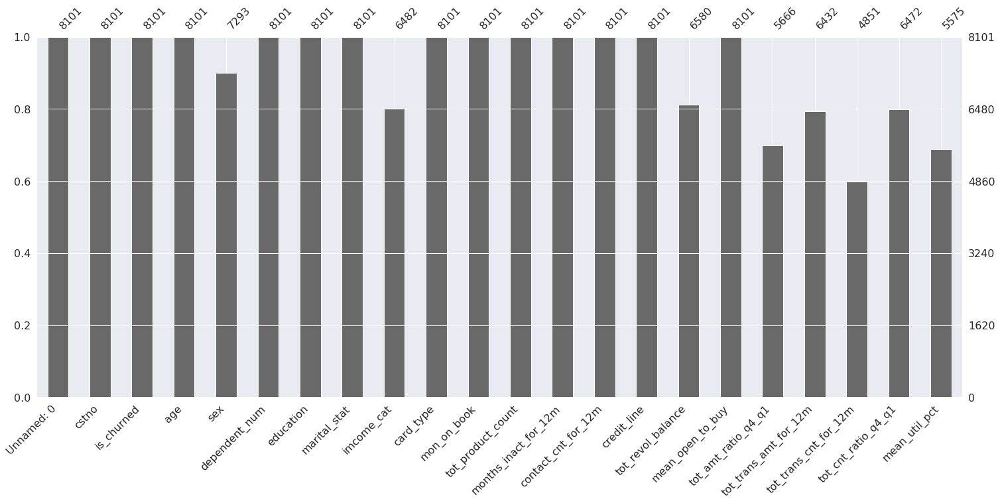

In [79]:
plt.figure(figsize=(12, 6))
msno.bar(eda_churner_df)
plt.show()

### Feature별 특징 분석

* 각 Feature를 탐색적 데이터 분석(EDA) 방식을 통해 고객 이탈 분석을 실시하고 모델 학습시 데이터 전처리 관점에서 분석할 필요가 있음
* 특히, 탐색적 데이터 분석시 수익성 지표로 '전체 거래 금액(tot_trans_amt_for_12m)을 활용하면 좋을 듯함

#### is_churned : 이탈  여부
- 0 : 유지, 1 : 이탈

In [80]:
eda_churner_df['is_churned'].value_counts()

0    6801
1    1300
Name: is_churned, dtype: int64

In [81]:
count_column_na_count(eda_churner_df, 'is_churned')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


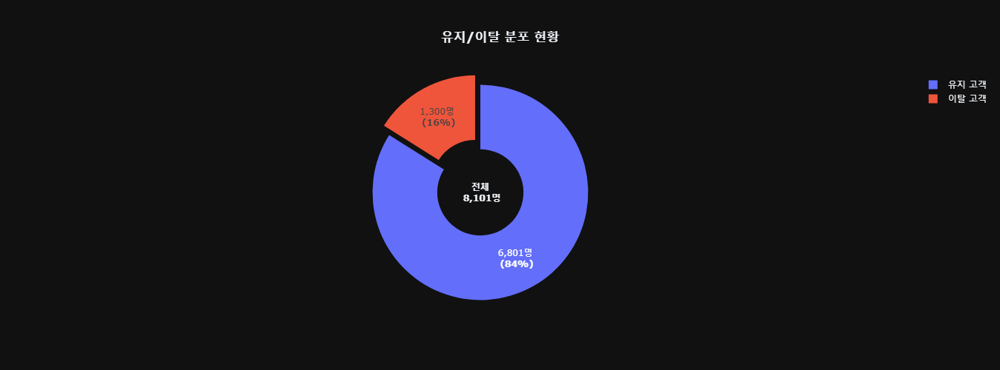

In [82]:
fig = go.Figure()
fig.add_trace(go.Pie(labels=['유지 고객', '이탈 고객'], values=eda_churner_df['is_churned'].value_counts().sort_index(), name='고객 분포', 
                     texttemplate = "%{value:,}명 <br><b>(%{percent})</b>",
                     title='<b>전체<br> 8,101명</b>',
                         textposition = "inside"))
fig.update_traces(hole=.4, hoverinfo="label+percent+name", pull=[0,0.1])
fig.update_layout(width=500, 
                  height=500, 
                  showlegend=True,
                  title_text="<b>유지/이탈 분포 현황<b>",
                  title_x = 0.5,
                  title_y = 0.9,
                  title_xanchor = "center",
                  title_yanchor = "middle",
                  template='plotly_dark',
                 )


fig.show()

#### age : 나이

* 데이터 건수 및 널 현황 

In [83]:
count_column_na_count(eda_churner_df, 'age')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [84]:
count_column_data_count(eda_churner_df, 'age')

 age exist_counts churned_counts total_counts exist_percents churned_percents
  68          1.0            1.0          2.0         50.00%           50.00%
  59         89.0           32.0        121.0         73.55%           26.45%
  54        191.0           54.0        245.0         77.96%           22.04%
  61         58.0           15.0         73.0         79.45%           20.55%
  62         56.0           14.0         70.0         80.00%           20.00%
  55        185.0           43.0        228.0         81.14%           18.86%
  41        246.0           56.0        302.0         81.46%           18.54%
  43        303.0           68.0        371.0         81.67%           18.33%
  48        304.0           68.0        372.0         81.72%           18.28%
  56        176.0           36.0        212.0         83.02%           16.98%
  30         44.0            9.0         53.0         83.02%           16.98%
  49        329.0           66.0        395.0         83.29%    

* 연속형 그래프로 확인

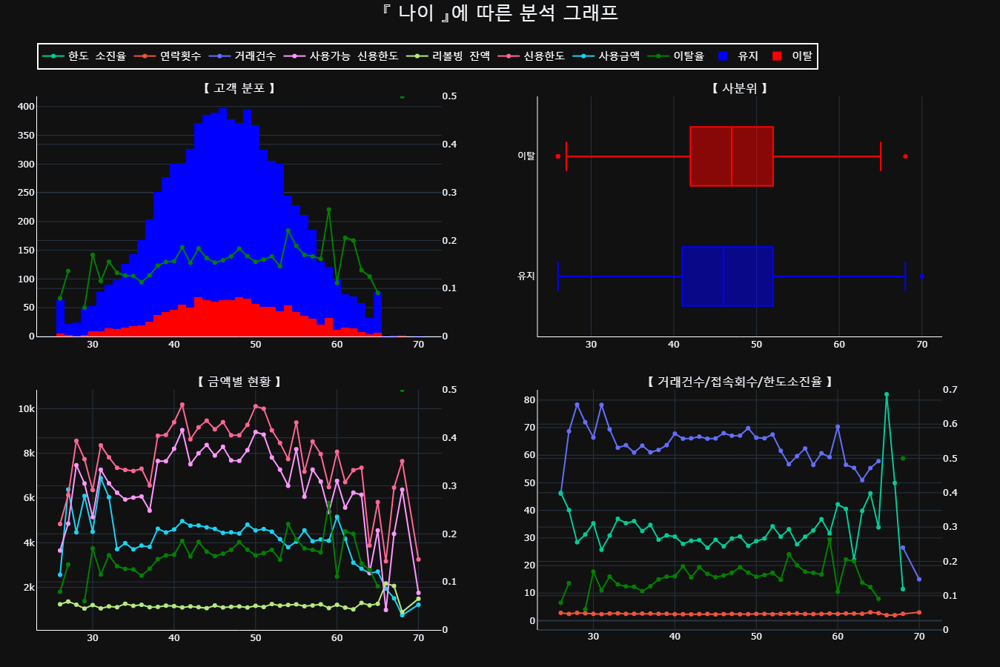

In [85]:
print_continuous_graphs(eda_churner_df, 'age', '나이')

* 범주화하여 범주형 그래프로 확인

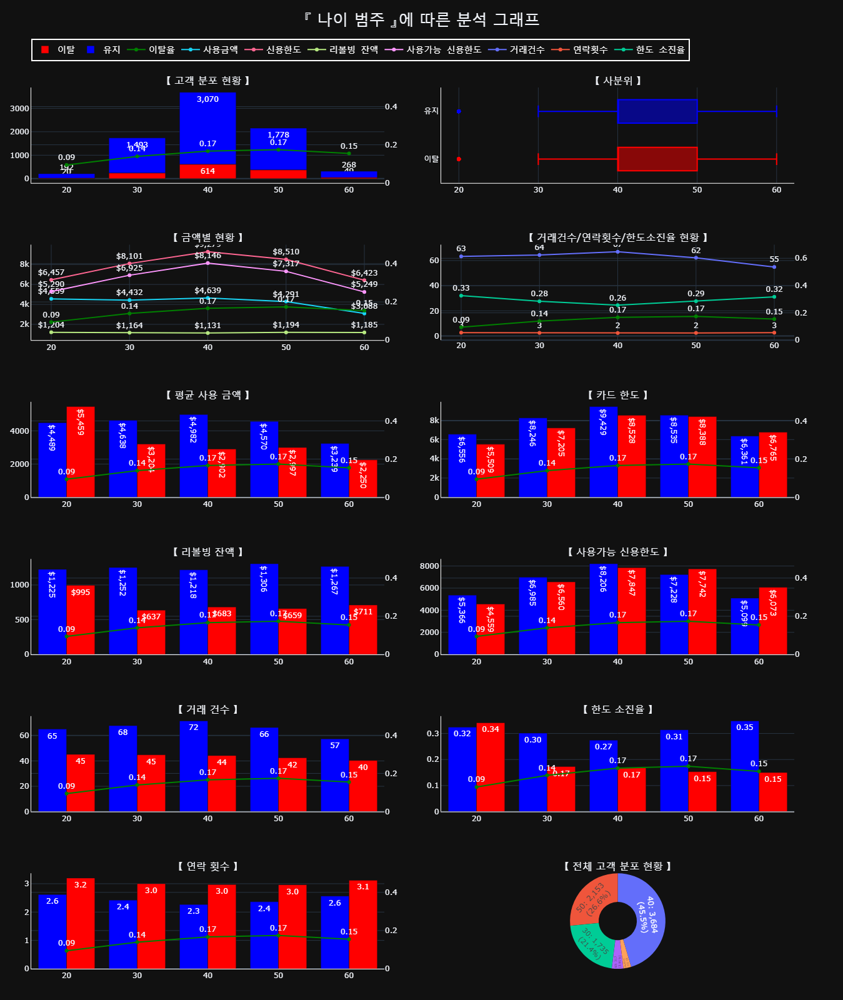

In [86]:
# 나이 범주화
eda_churner_df = change_categorical_data(eda_churner_df, 'age', 20, 10)
print_category_graphs(eda_churner_df, 'age_category', '나이 범주')

* 나이별로 유지고객과 이탈고객의 건수가 균일하게 분포되어 있으며 20 ~ 32세의 고객들의 수는 많지 않으나 평균 사용금액이 다른 나이대 보다 높음을 알 수 있음

#### sex : 성별

* 데이터 건수 및 널 현황 

In [87]:
count_column_na_count(eda_churner_df, 'sex')

tot_counts data_counts null_counts data_percents null_percents
     8,101       7,293         808        90.03%         9.97%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [88]:
count_column_data_count(eda_churner_df, 'sex')

sex exist_counts churned_counts total_counts exist_percents churned_percents
  F        3,157            683        3,840         82.21%           17.79%
  M        2,969            484        3,453         85.98%           14.02%


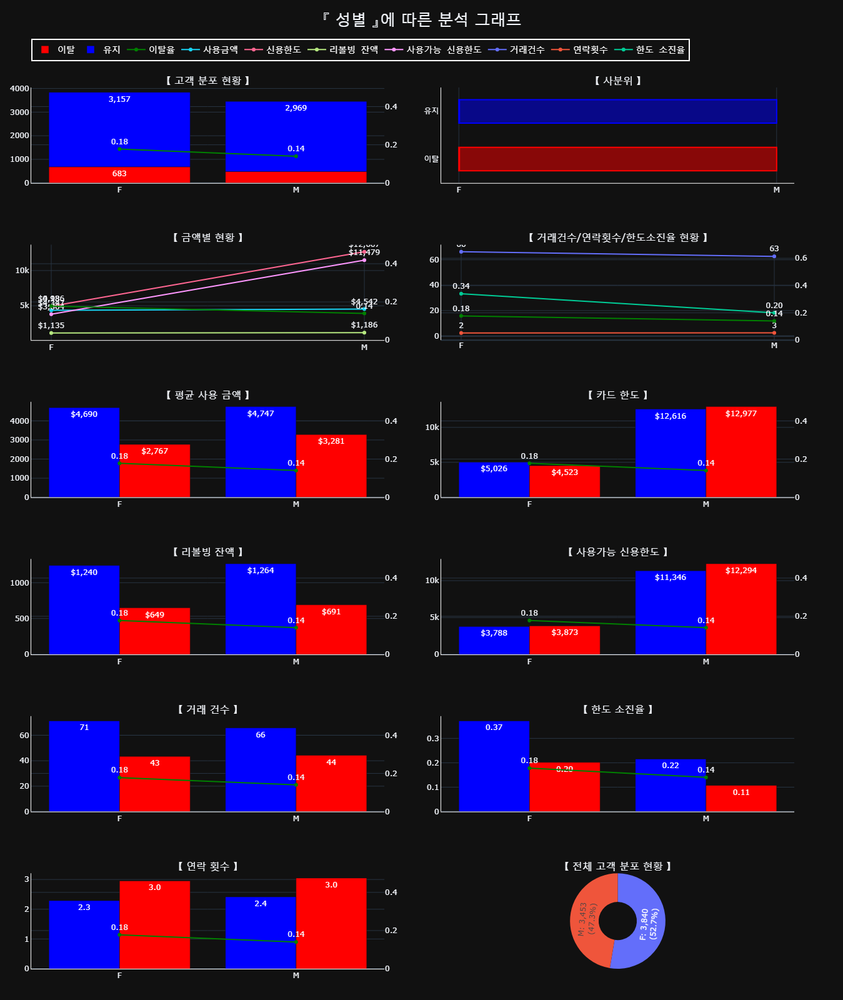

In [89]:
print_category_graphs(eda_churner_df, 'sex', '성별')

* 성별 이탈율은 비슷한 양상을 보이고 있음
* 남성의 경우 카드한도 대비 사용금액이 낮고, 이에 따라 한도 소진율이 낮음. 따라서, 남성 고객의 한도 금액을 재조정하여 충당금 이슈에 대응할 필요가 있음

#### dependent_num : 부양가족수

* 데이터 건수 및 널 현황 

In [90]:
count_column_na_count(eda_churner_df, 'dependent_num')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [91]:
count_column_data_count(eda_churner_df, 'dependent_num')

 dependent_num exist_counts churned_counts total_counts exist_percents churned_percents
             3        1,838            384        2,222         82.72%           17.28%
             4        1,011            201        1,212         83.42%           16.58%
             5          274             53          327         83.79%           16.21%
             2        1,808            342        2,150         84.09%           15.91%
             0          614            111          725         84.69%           15.31%
             1        1,256            209        1,465         85.73%           14.27%


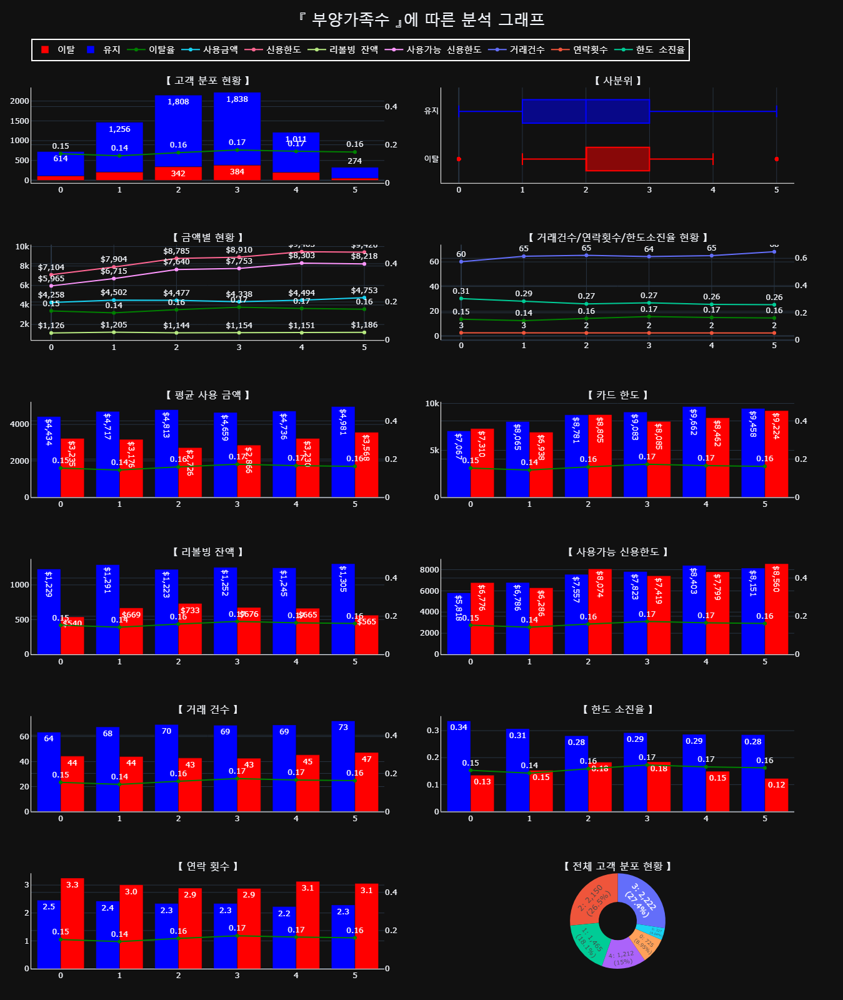

In [92]:
print_category_graphs(eda_churner_df, 'dependent_num', '부양가족수')

* 특이사항 없음

#### education : 교육수준
- Graduate : 대학원
- High School : 고졸
- Unknown
- Uneducated : 미교육
- College : 단과대학
- Post-Graduate : 보딩스쿨(재수)
- Doctorate :박사

* 데이터 건수 및 널 현황 

In [93]:
count_column_na_count(eda_churner_df, 'education')


tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [94]:
count_column_data_count(eda_churner_df, 'education')

     education exist_counts churned_counts total_counts exist_percents churned_percents
     Doctorate          274             81          355         77.18%           22.82%
 Post-Graduate          333             74          407         81.82%           18.18%
       Unknown        1,002            203        1,205         83.15%           16.85%
      Graduate        2,129            399        2,528         84.22%           15.78%
    Uneducated          990            181        1,171         84.54%           15.46%
   High School        1,371            248        1,619         84.68%           15.32%
       College          702            114          816         86.03%           13.97%


* 범주형 그래프로 확인

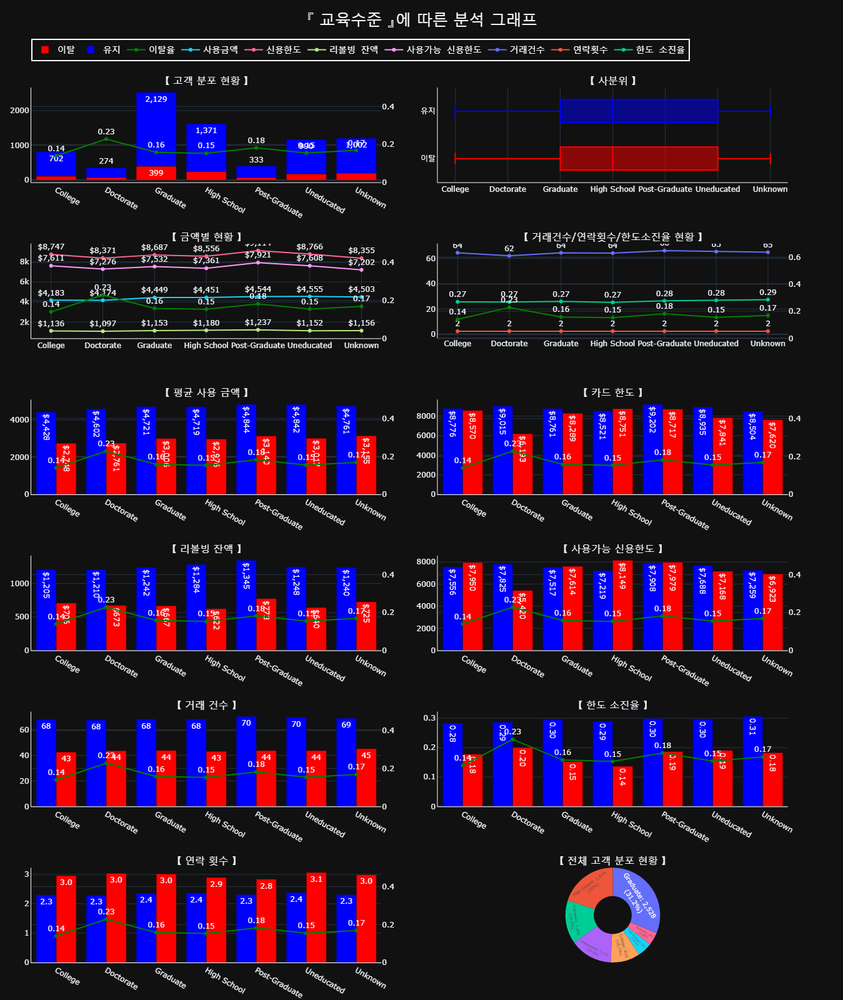

In [95]:
print_category_graphs(eda_churner_df, 'education', '교육수준')

* 박사 학위를 받은 고객의 경우 이탈율이 높게 나타나고 있음
* 박사 학위를 받은 고객의 수는 적으나 사용금액, 한도 소진율 등이 높아 은행 입장에서 많은 수익을 낼 것으로 예상되는 고객군임
* 따라서, 박사 학위를 받은 고객의 이탈을 방지 및 신규 고객 가입을 위한 혜택 및 마케팀을 고려해야 함.
* 추가적으로 다른 카드사와 비교를 통해 고학력자를 위한 서비스 분석도 병행하면 좋은 듯함.

#### marital_stat : 결혼상태
- Married  : 결혼
- Single   : 미혼
- Divorced : 이혼

* 데이터 건수 및 널 현황 

In [96]:
count_column_na_count(eda_churner_df, 'marital_stat')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [97]:
count_column_data_count(eda_churner_df, 'marital_stat')

marital_stat exist_counts churned_counts total_counts exist_percents churned_percents
    Divorced          508            103          611         83.14%           16.86%
      Single        2,620            524        3,144         83.33%           16.67%
     Unknown          484             95          579         83.59%           16.41%
     Married        3,189            578        3,767         84.66%           15.34%


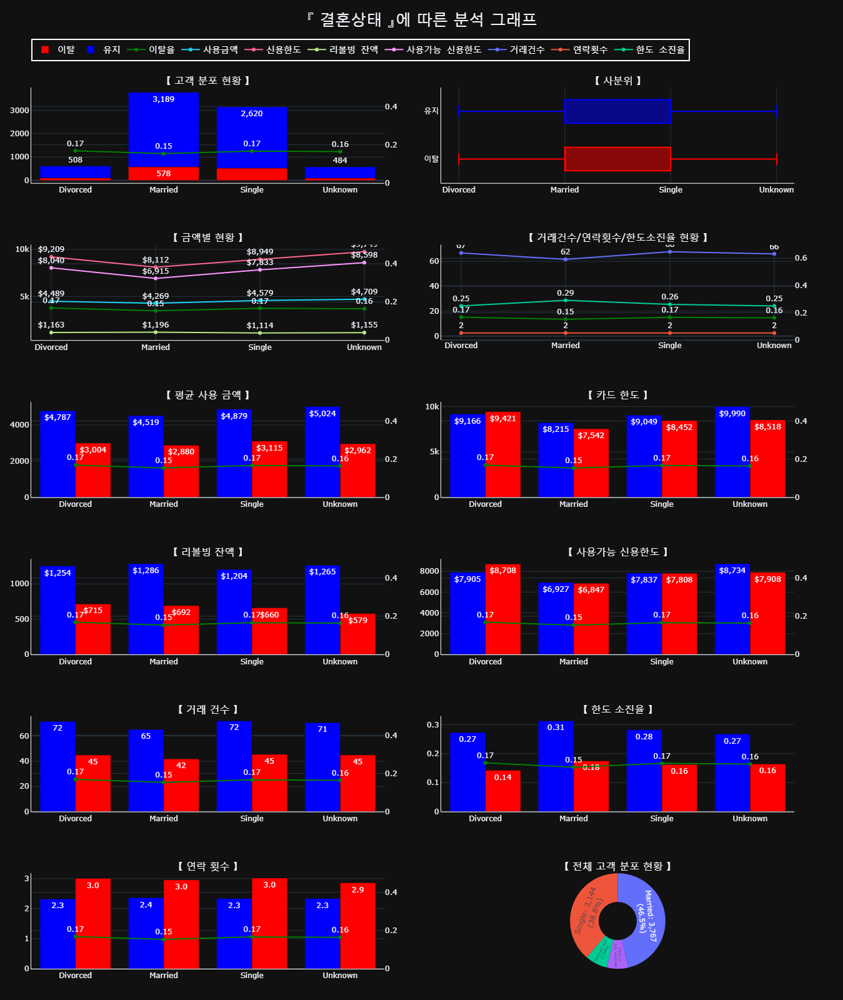

In [98]:
print_category_graphs(eda_churner_df, 'marital_stat', '결혼상태')

특이사항 없음

#### imcome_cat : 수입규모

* 데이터 건수 및 널 현황 

In [99]:
count_column_na_count(eda_churner_df, 'imcome_cat')


tot_counts data_counts null_counts data_percents null_percents
     8,101       6,482       1,619        80.01%        19.99%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [100]:
count_column_data_count(eda_churner_df, 'imcome_cat')

     imcome_cat exist_counts churned_counts total_counts exist_percents churned_percents
        Unknown          574            128          702         81.77%           18.23%
 Less than $40K        1,871            406        2,277         82.17%           17.83%
        $120K +          390             83          473         82.45%           17.55%
   $80K - $120K          830            158          988         84.01%           15.99%
    $40K - $60K          982            169        1,151         85.32%           14.68%
    $60K - $80K          768            123          891         86.20%           13.80%


* 범주형 그래프로 확인

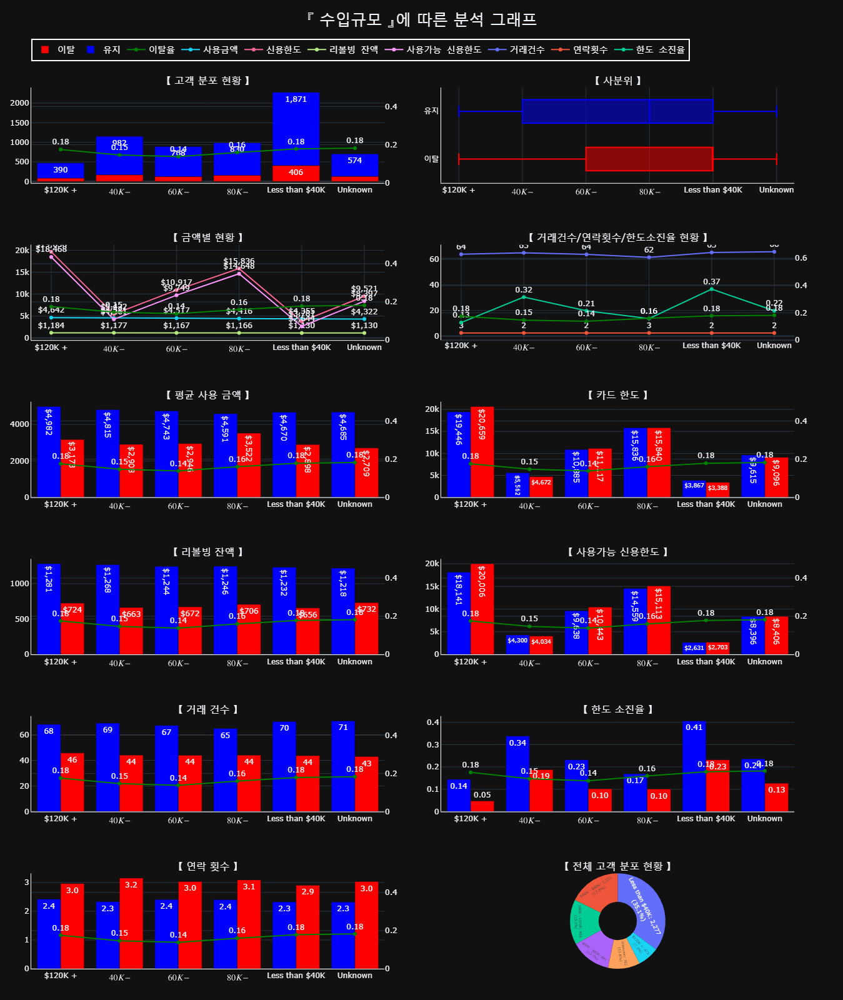

In [101]:
print_category_graphs(eda_churner_df, 'imcome_cat', '수입규모')

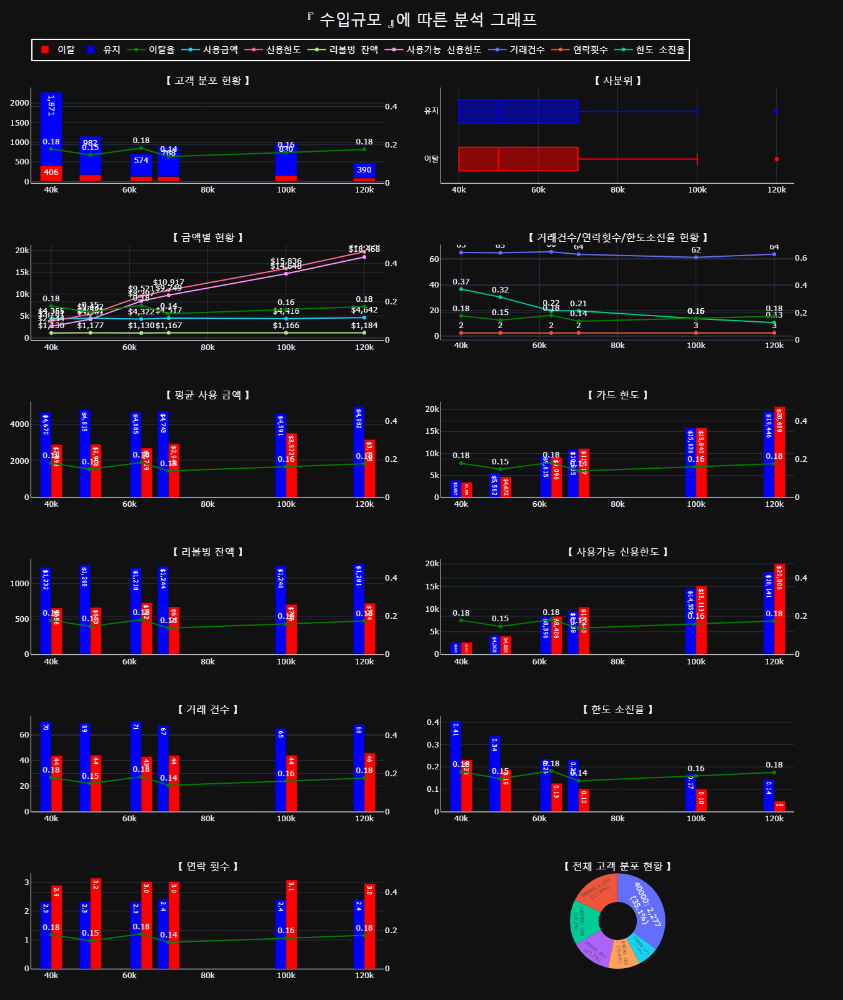

In [102]:
    df = eda_churner_df.copy()
    df['imcome_cat']=df['imcome_cat'].replace({'Less than $40K':40000, '$40K - $60K':50000, '$60K - $80K':70000, '$80K - $120K':100000, '$120K +':120000, 'Unknown':63000})
    print_category_graphs(df, 'imcome_cat', '수입규모')

* 소득 수입규모별 이탈율의 차이는 없음
* 소득 수입규모가 4만 ~ 5만 달러 사이의 고객 비중이 높으며 사용금액 및 한도 소진율이 높아 매스마케팅을 통해 중점적으로 관리할 필요가 있음
* 10만불 이상의 고객은 카드 한도 대비 사용금액이 적고 한도 소진율도 낮아 충당금 이슈에 대응하기 위해 한도를 조정할 필요가 있음<br>
<br>


* 모델 학습시 데이터를 수치화 하면 보다 개선된 성능을 도출할 것으로 보임
    - replace({'Less than $40K':40000, '$40K - $60K':50000, '$60K - $80K':70000, '$80K - $120K':100000, '$120K +':120000, 'Unknown':63000})

#### card_type : 카드종류

* 데이터 건수 및 널 현황 

In [103]:
count_column_na_count(eda_churner_df, 'card_type')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [104]:
count_column_data_count(eda_churner_df, 'card_type')

card_type exist_counts churned_counts total_counts exist_percents churned_percents
 Platinum           10              5           15         66.67%           33.33%
     Gold           77             16           93         82.80%           17.20%
     Blue        6,338          1,219        7,557         83.87%           16.13%
   Silver          376             60          436         86.24%           13.76%


* 범주형 그래프로 확인

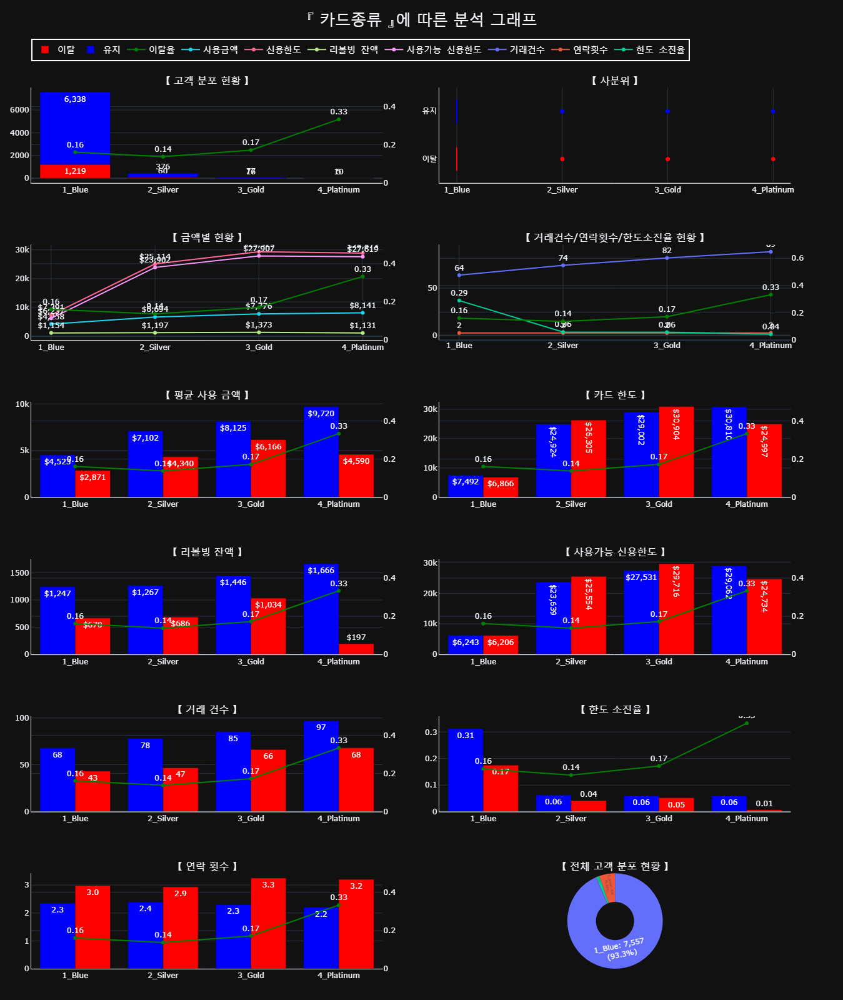

In [105]:
# print_category_graphs(eda_churner_df, 'card_type', '카드종류')
df = eda_churner_df.copy()
df['card_type']=df['card_type'].replace({'Blue':'1_Blue', 'Silver':'2_Silver', 'Gold':'3_Gold', 'Platinum':'4_Platinum'})
print_category_graphs(df, 'card_type', '카드종류')

* 플래티넘 카드 소유자의 이탈율이 상당히 높게 나타나고 있으며, 이는 플래티넘 카드를 사용하는 고객의 만족도가 매우 낮은 것으로 보임
* 해당 카드의 이탈로 인해 다른 상품(예금, 신탁, 수익증권, 방카, 외환, 대출 등)에 영향을 미치므로 수익성 차원에서 적극 대응해야할 것으로 보임
* 플래티넘 등 고급 카드에 대해 다른 카드사와 수수료, 혜택 등을 검토하여 이탈율을 낮출 필요가 있음 

#### mon_on_book : 은행 거래 기간 (개월 수)

* 데이터 건수 및 널 현황 

In [106]:
count_column_na_count(eda_churner_df, 'mon_on_book')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [107]:
count_column_data_count(eda_churner_df, 'mon_on_book')

 mon_on_book exist_counts churned_counts total_counts exist_percents churned_percents
          15           20              8           28         71.43%           28.57%
          50           64             23           87         73.56%           26.44%
          51           49             15           64         76.56%           23.44%
          52           41             11           52         78.85%           21.15%
          39          221             55          276         80.07%           19.93%
          44          150             37          187         80.21%           19.79%
          18           37              9           46         80.43%           19.57%
          30          187             43          230         81.30%           18.70%
          41          198             45          243         81.48%           18.52%
          37          226             50          276         81.88%           18.12%
          22           68             15           83 

* 연속형 그래프로 확인

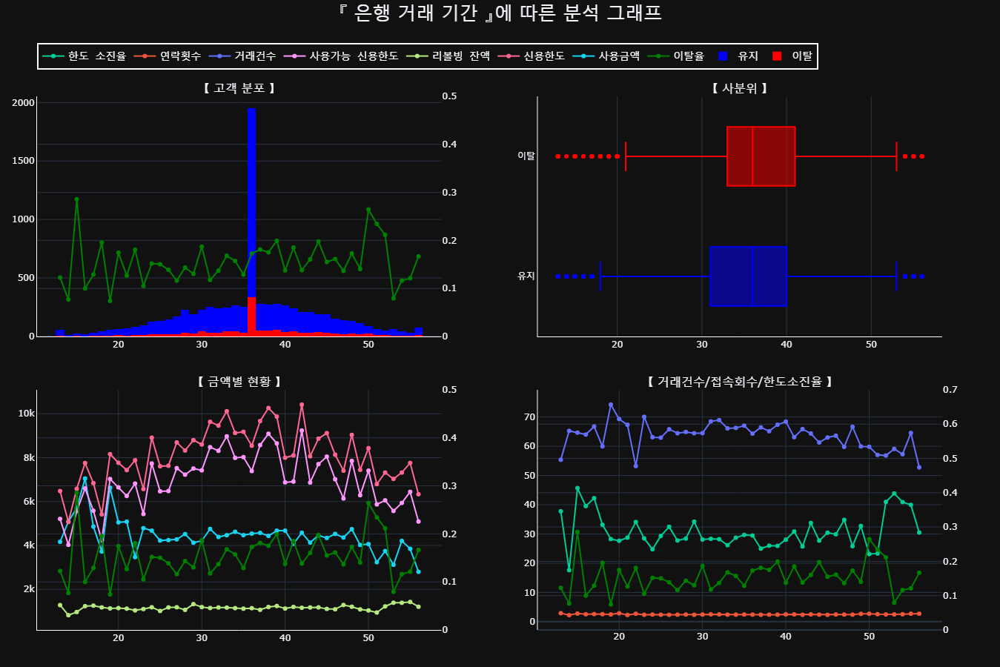

In [108]:
print_continuous_graphs(eda_churner_df, 'mon_on_book', '은행 거래 기간')

* 범주화하여 범주형 그래프로 확인

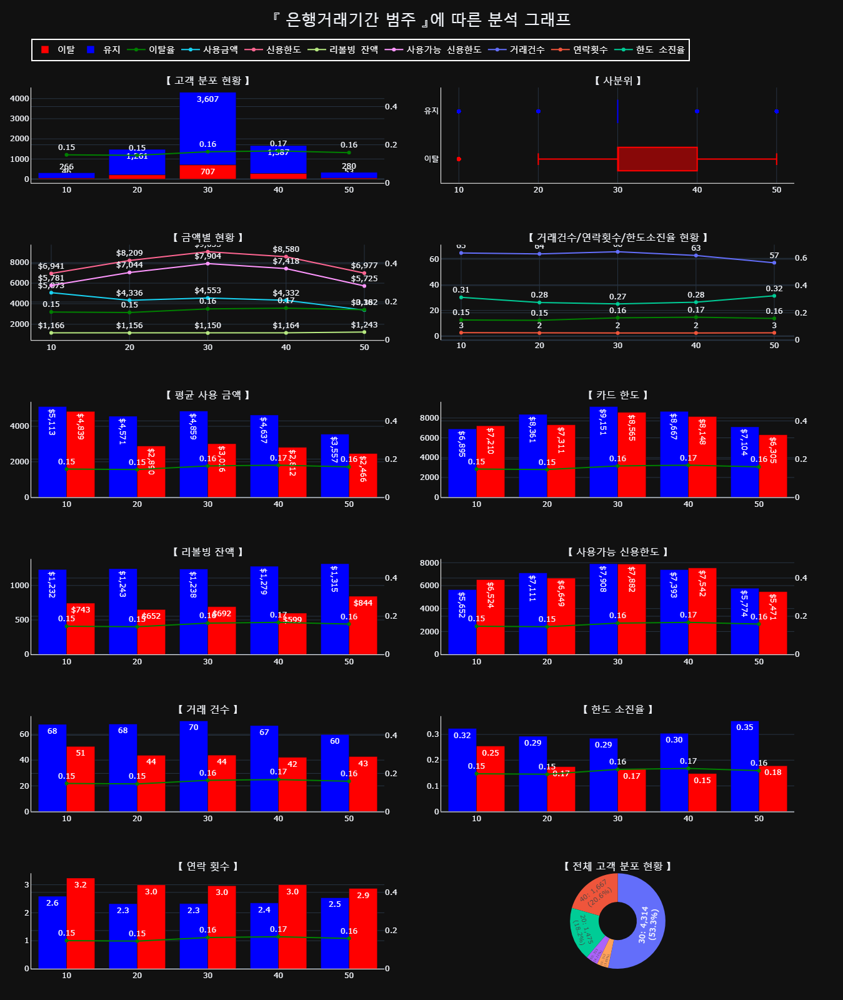

In [109]:
eda_churner_df = change_categorical_data(eda_churner_df, 'mon_on_book', 10, 10)
print_category_graphs(eda_churner_df, 'mon_on_book_category', '은행거래기간 범주')

* 이탈 관련 특이사항 없음

* 모델학습시 표준화 수행 필요

#### tot_product_count : 현재 보유 상품 개수

* 데이터 건수 및 널 현황 

In [110]:
count_column_na_count(eda_churner_df, 'tot_product_count')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [111]:
count_column_data_count(eda_churner_df, 'tot_product_count')

 tot_product_count exist_counts churned_counts total_counts exist_percents churned_percents
                 2          712            273          985         72.28%           27.72%
                 1          542            184          726         74.66%           25.34%
                 3        1,529            323        1,852         82.56%           17.44%
                 4        1,349            190        1,539         87.65%           12.35%
                 5        1,333            178        1,511         88.22%           11.78%
                 6        1,336            152        1,488         89.78%           10.22%


* 범주형 그래프로 확인

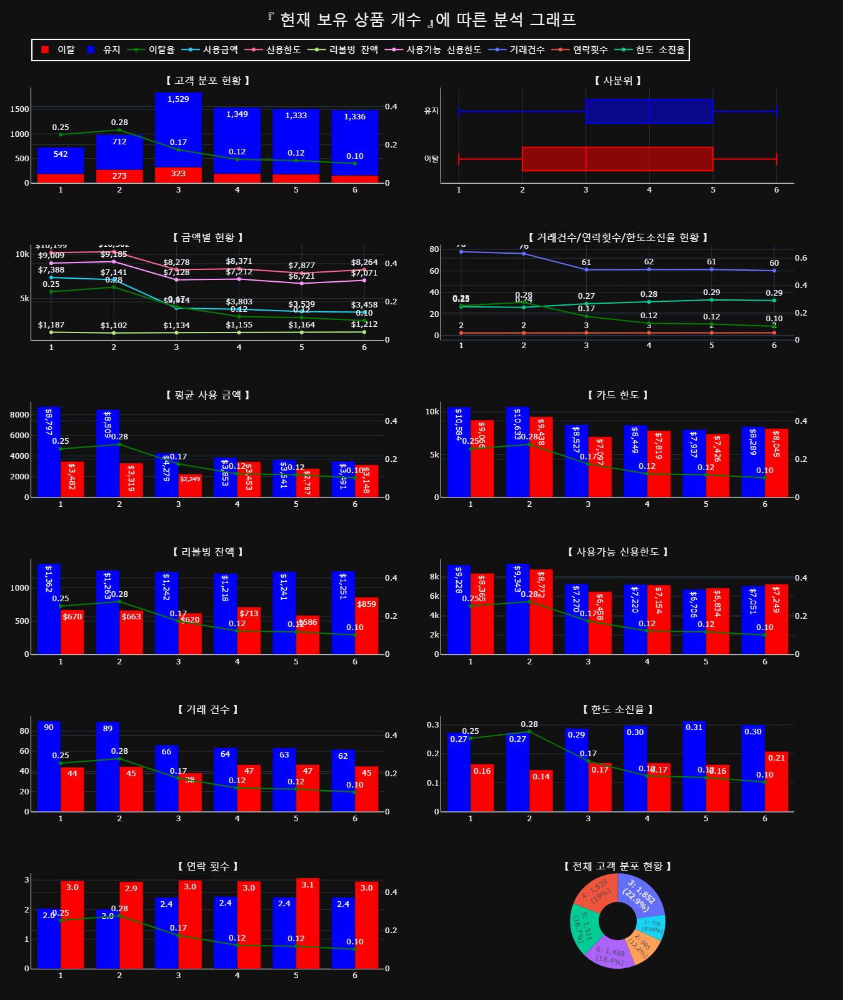

In [112]:
print_category_graphs(eda_churner_df, 'tot_product_count', '현재 보유 상품 개수')

* 신용카드의 개수가 1 ~ 2개를 소유한 경우 사용금액이 높으나, 반면 이탈율이 높음. 유지 고객의 카드 보유 개수의 중앙값은 4개이고 이탈한 고객의 중앙값은 3개를 나타내고 있음
* 따라서, 신용카드 개수가 3 ~ 4개 이상의 카드를 보유하여 이탈을 예방할 필요가 있음

#### months_inact_for_12m : 최근 12개월 동안 카드 거래가 없었던 개월 수

* 데이터 건수 및 널 현황 

In [113]:
count_column_na_count(eda_churner_df, 'months_inact_for_12m')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [114]:
count_column_data_count(eda_churner_df, 'months_inact_for_12m')

 months_inact_for_12m exist_counts churned_counts total_counts exist_percents churned_percents
                    0            8             14           22         36.36%           63.64%
                    4          241            105          346         69.65%           30.35%
                    3        2,430            664        3,094         78.54%           21.46%
                    5          115             29          144         79.86%           20.14%
                    6           87             17          104         83.65%           16.35%
                    2        2,218            393        2,611         84.95%           15.05%
                    1        1,702             78        1,780         95.62%            4.38%


* 범주형 그래프로 확인

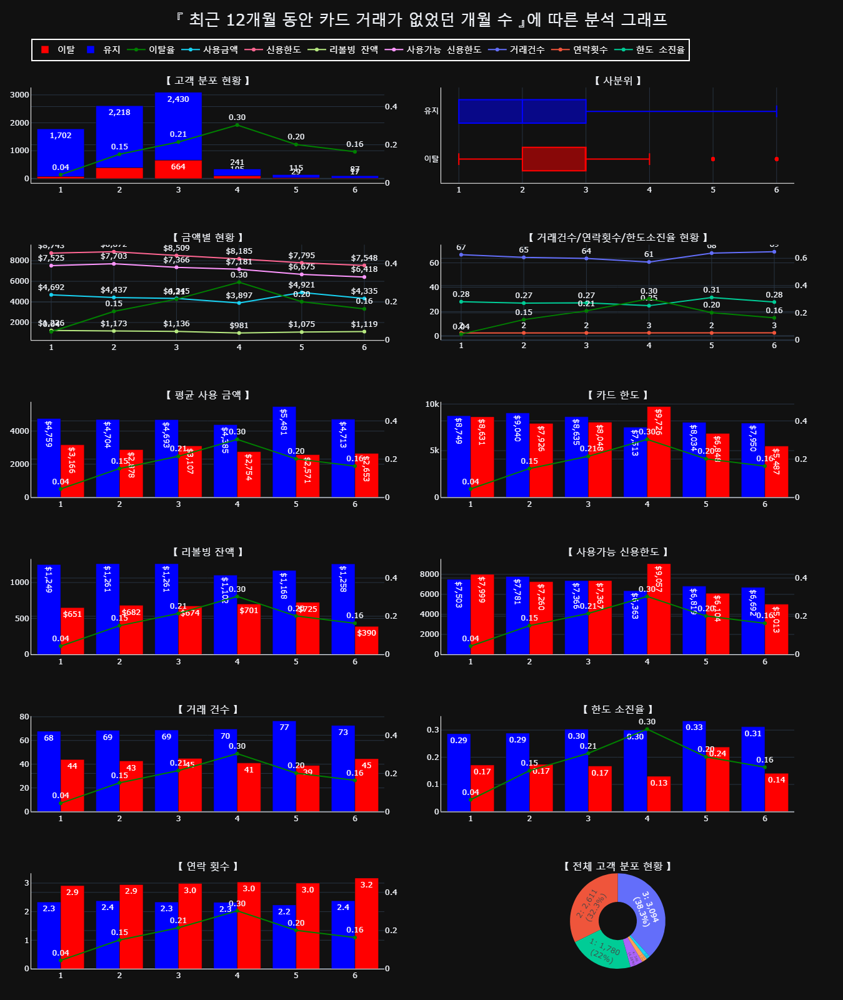

In [115]:
df =eda_churner_df.copy()
df = df.drop(df[df['months_inact_for_12m'] == 0].index) # 이상치 제거
print_category_graphs(df, 'months_inact_for_12m', '최근 12개월 동안 카드 거래가 없었던 개월 수')

* 거래가 없었던 개월수 0인경우 이상치로 보여 제거하고 분석 실시
* 카드 거래 없는 개월수가 4개월인 경우 이탈율이 정점을 찍고 이후 감소하는 경향을 보이고 있음
* 이탈고객의 중앙값은 3개월로 3 ~ 4개월 카드 거래가 없는 고객을 대상으로 Wake-up 마케팅를 실시할 필요가 있음<br>
<br>

- 모델 학습시 이상치 처리 검토 필요

#### contact_cnt_for_12m : 최근 12개월 동안 연락 횟수

* 데이터 건수 및 널 현황 

In [116]:
count_column_na_count(eda_churner_df, 'contact_cnt_for_12m')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 데이터 속성별 상세 현황

In [117]:
count_column_data_count(eda_churner_df, 'contact_cnt_for_12m')

 contact_cnt_for_12m exist_counts churned_counts total_counts exist_percents churned_percents
                   6          0.0           45.0          0.0          0.00%          100.00%
                   5         90.0           43.0        133.0         67.67%           32.33%
                   4        843.0          249.0      1,092.0         77.20%           22.80%
                   3      2,155.0          561.0      2,716.0         79.34%           20.66%
                   2      2,282.0          314.0      2,596.0         87.90%           12.10%
                   1      1,122.0           85.0      1,207.0         92.96%            7.04%
                   0        309.0            3.0        312.0         99.04%            0.96%


* 범주형 그래프로 확인

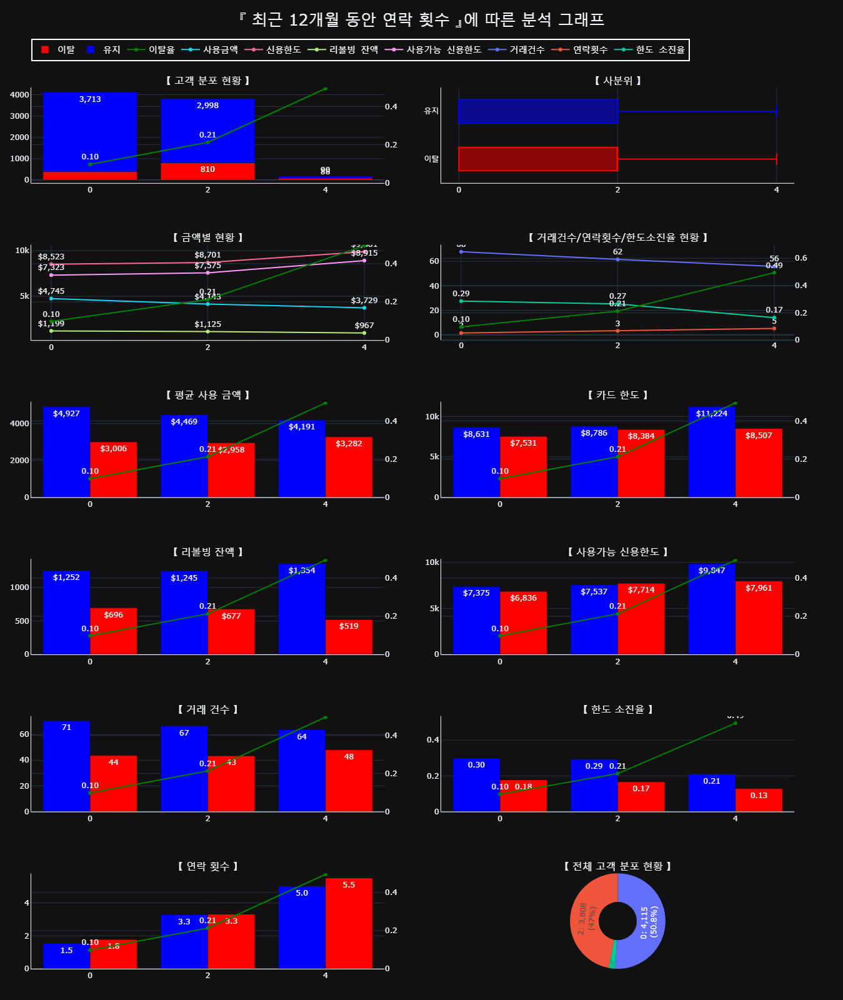

In [118]:
eda_churner_df = change_categorical_data(eda_churner_df, 'contact_cnt_for_12m', 0, 2)
print_category_graphs(eda_churner_df, 'contact_cnt_for_12m_category', '최근 12개월 동안 연락 횟수')

* 접촉 건수가 많을 수록 이탈율이 높아지는 경향을 보이고 있으며, 이는 연체 독촉, 직원 서비스 불만족으로 이탈하는 것으로 보임
* 따라서, 카드 담당부서에서 연체 독촉 프로세스, 대고객 대응 가이드를 점검해 볼 필요가 있음. 또한, 주기적으로 고객 접촉 이력을 관리하고 분석할 필요가 있음

#### credit_line : 카드 한도

* 데이터 건수 및 널 현황 

In [119]:
count_column_na_count(eda_churner_df, 'credit_line')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 범주화하여 범주형 그래프로 확인

In [120]:
eda_churner_df = change_categorical_data(eda_churner_df, 'credit_line', 0, 5000)
print_category_graphs(eda_churner_df, 'credit_line_category', '카드 한도 범주')

* 카드한도가 0 ~ 5천불 구간의 고객수가 많으나 이탈율이 높음. 이는 낮은 한도로 인해 이탈하는 고객이 발생할 수 있어 한도 증액 검토 필요

#### tot_revol_balance : 리볼빙 잔액

* 데이터 건수 및 널 현황 

In [121]:
count_column_na_count(eda_churner_df, 'tot_revol_balance')

tot_counts data_counts null_counts data_percents null_percents
     8,101       6,580       1,521        81.22%        18.78%
----------------------------------------------------------------------


* 범주화하여 범주형 그래프로 확인

In [122]:
eda_churner_df = change_categorical_data(eda_churner_df, 'tot_revol_balance', 0, 500)
print_category_graphs(eda_churner_df, 'tot_revol_balance_category', '리볼빙 잔액 범주')

* 리볼빙(일부 결제금액 이월) 잔액이 500불 이하 와 2천 ~ 2.5천불 구간의 고객의 이탈 비율이 높게 나타나고 있음
* 좀 더 세부적으로 분석할 필요가 있음<br>
<br>
* 리볼빙 잔액은 18%의 결측치(Null)가 존재하고 있어 모델 학습시 결측치 처리방법 고민할 필요 있음    

#### mean_open_to_buy : 평균 사용가능 신용한도

* 데이터 건수 및 널 현황 

In [123]:
count_column_na_count(eda_churner_df, 'mean_open_to_buy')

tot_counts data_counts null_counts data_percents null_percents
     8,101       8,101           0       100.00%         0.00%
----------------------------------------------------------------------


* 범주화하여 범주형 그래프로 확인

In [124]:
eda_churner_df = change_categorical_data(eda_churner_df, 'mean_open_to_buy', 0, 5000)
print_category_graphs(eda_churner_df, 'mean_open_to_buy_category', '평균 사용가능 신용한도 범주')

* 이탈율은 특이사항 없음
* 평균 사용가능 신용한도가 5천불 이하의 고객들은 카드 한도는 낮고, 한도 소진율은 높아 신용등급, 연체 등을 감안하여 한도를 재조정(증액)할 필요가 있어 보임

#### tot_amt_ratio_q4_q1 : 1분기 대비 4분기의 거래 금액 비율

* 데이터 건수 및 널 현황 

In [125]:
count_column_na_count(eda_churner_df, 'tot_amt_ratio_q4_q1')

tot_counts data_counts null_counts data_percents null_percents
     8,101       5,666       2,435        69.94%        30.06%
----------------------------------------------------------------------


In [126]:
eda_churner_df = change_categorical_data(eda_churner_df, 'tot_amt_ratio_q4_q1', 0, 0.4)
print_category_graphs(eda_churner_df, 'tot_amt_ratio_q4_q1_category', '1분기 대비 4분기의 거래 금액 비율 범주')

* 1분기 대비 4분기의 거래 금액이 0.5이하인 경우 이탈율이 높아지고 있음.
* 따라서, 1분기 대비 4분기의 거래 금액이 0.5인 고객을 대상으로 매스 마케팅이 필요한 것으로 보임

#### tot_trans_amt_for_12m : 최근 12개월 동안의 거래 금액

In [127]:
count_column_na_count(eda_churner_df, 'tot_trans_amt_for_12m')

tot_counts data_counts null_counts data_percents null_percents
     8,101       6,432       1,669        79.40%        20.60%
----------------------------------------------------------------------


In [128]:
eda_churner_df = change_categorical_data(eda_churner_df, 'tot_trans_amt_for_12m', 0, 2000)
print_category_graphs(eda_churner_df, 'tot_trans_amt_for_12m_category', '최근 12개월 동안의 거래 금액')

* 사용금액이 2천불 이하인 고객의 이탈율이 높게 나타나고 있음.

#### tot_trans_cnt_for_12m : 최근 12개월 동안의 거래 횟수

In [129]:
count_column_na_count(eda_churner_df, 'tot_trans_cnt_for_12m')

tot_counts data_counts null_counts data_percents null_percents
     8,101       4,851       3,250        59.88%        40.12%
----------------------------------------------------------------------


In [130]:
eda_churner_df

,Unnamed: 0,cstno,is_churned,age,sex,dependent_num,education,marital_stat,imcome_cat,card_type,...,tot_cnt_ratio_q4_q1,mean_util_pct,age_category,mon_on_book_category,contact_cnt_for_12m_category,credit_line_category,tot_revol_balance_category,mean_open_to_buy_category,tot_amt_ratio_q4_q1_category,tot_trans_amt_for_12m_category
0,0,708082083,0,45,F,3,High School,Married,Less than $40K,Blue,...,0.734,0.469,40,30,2,0.0,NaN,0.0,0.8,NaN
1,1,708083283,1,58,M,0,Unknown,Single,$40K - $60K,Blue,...,0.400,NaN,50,40,2,0.0,2500,0.0,0.8,0.0
2,2,708084558,1,46,M,3,Doctorate,Divorced,$80K - $120K,Blue,...,0.000,0.214,40,30,2,5000,1500,5000,NaN,0.0
3,3,708085458,0,34,F,2,Uneducated,Single,Less than $40K,Blue,...,0.952,0.000,30,20,0,0.0,0.0,0.0,0.8,2000
4,4,708086958,0,49,F,2,Uneducated,Married,Unknown,Blue,...,NaN,0.239,40,40,0,0.0,500,0.0,0.4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8096,8096,828285858,0,41,F,3,College,Married,NaN,Blue,...,NaN,0.532,40,30,0,0.0,500,0.0,NaN,NaN
8097,8097,828288333,0,50,M,0,Uneducated,Married,$60K - $80K,Blue,...,0.842,0.181,40,40,2,0.0,500,0.0,NaN,NaN
8098,8098,828294933,1,49,F,3,High School,Married,Less than $40K,Blue,...,0.565,NaN,40,40,2,0.0,2000,0.0,NaN,NaN
8099,8099,828298908,0,54,M,4,Graduate,Married,$120K +,Blue,...,0.741,0.709,50,40,0,0.0,2000,0.0,0.4,0.0


In [131]:
eda_churner_df = change_categorical_data(eda_churner_df, 'tot_trans_cnt_for_12m', 0, 20)
# print_continuous_graphs(eda_churner_df, 'tot_trans_cnt_for_12m', '최근 12개월 동안의 거래 횟수')
print_category_graphs(eda_churner_df, 'tot_trans_cnt_for_12m_category', '최근 12개월 동안의 거래 횟수')

In [132]:
eda_churner_df = change_categorical_data(eda_churner_df, 'tot_trans_cnt_for_12m', 0, 20)
print_category_graphs(eda_churner_df, 'tot_trans_cnt_for_12m_category', '최근 12개월 동안의 거래 횟수')

* 거래건수가 많을수록 유지되는 고객이 많으며 최근 12개월 동인 50번 이하의 고개 이탈율이 높아지므로 정기적으로 거래건수를 분석하여 대응할 필요가 있음

#### tot_cnt_ratio_q4_q1 : 1분기 대비 4분기의 거래 횟수 비율

In [133]:
count_column_na_count(eda_churner_df, 'tot_cnt_ratio_q4_q1')

tot_counts data_counts null_counts data_percents null_percents
     8,101       6,472       1,629        79.89%        20.11%
----------------------------------------------------------------------


In [134]:
eda_churner_df = change_categorical_data(eda_churner_df, 'tot_cnt_ratio_q4_q1', 0, 0.5)
print_category_graphs(eda_churner_df, 'tot_cnt_ratio_q4_q1_category', '1분기 대비 4분기의 거래 횟수 비율')

* 1분기 대비 4분기의 거래 횟수가 0.5 이하인 경우 이탈율이 높음. 거래 비율이 0.5이하인 고객을 대상으로 매스 마케팅(SMS 및 이메일 활용) 실시할 필요 있음

#### mean_util_pct : 평균 한도 소진율

In [135]:
count_column_na_count(eda_churner_df, 'mean_util_pct')

tot_counts data_counts null_counts data_percents null_percents
     8,101       5,575       2,526        68.82%        31.18%
----------------------------------------------------------------------


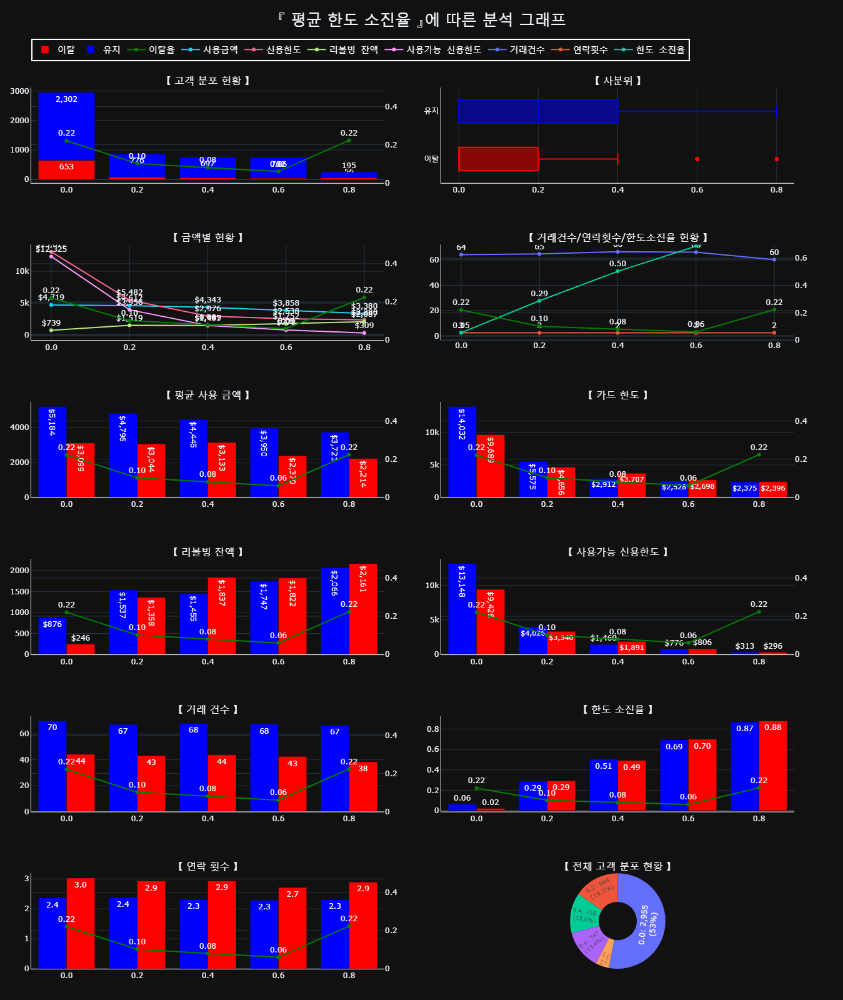

In [136]:
eda_churner_df = change_categorical_data(eda_churner_df, 'mean_util_pct', 0, 0.2)
print_category_graphs(eda_churner_df, 'mean_util_pct_category', '평균 한도 소진율')

* 한도 소진율이 0.2 이하인 경우 이탈율이 높음
* 한도 소진율이 0.2이하인 고객의 비율이 53%로 높게 형성되어 있어 전반적으로 충당금 이슈를 위해 한도 조정이 필요한 것으로 보임

#### 연속형 데이터 분포

findfont: Font family ['Malgun Gothic'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Malgun Gothic'] not found. Falling back to DejaVu Sans.


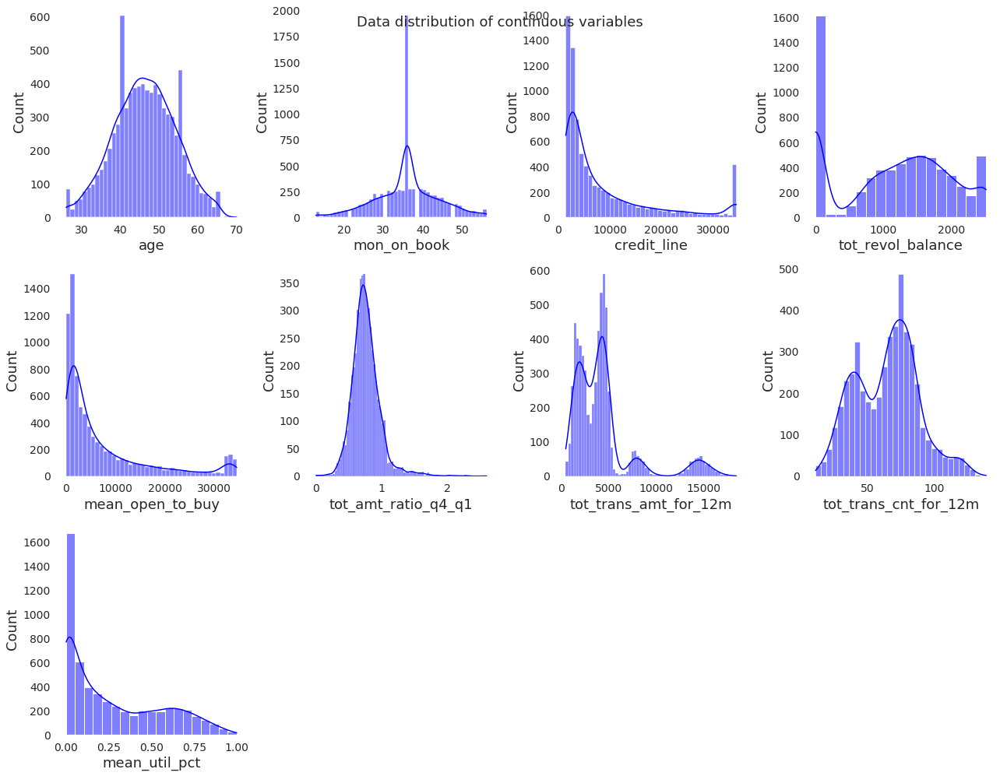

In [137]:
plt.figure(figsize=(18, 18))
# for i, col in enumerate(bank_churner_df.drop(['is_churned'], axis=1).select_dtypes(include=['int','float']).columns):
for i, col in enumerate(['age', 'mon_on_book', 'credit_line', 'tot_revol_balance','mean_open_to_buy','tot_amt_ratio_q4_q1','tot_trans_amt_for_12m','tot_trans_cnt_for_12m','mean_util_pct']):        
# for i, col in enumerate(['age', 'mon_on_book', 'credit_line' ]):    
    # We exclude the 'y' column and only consider the columns of numerical type.
    # Excluimos la columna 'y' y solo consideramos las columnas de tipo numérico.

    plt.rcParams['axes.facecolor'] = 'white'
    ax = plt.subplot(4, 4, i+1)  # Creating a subplot for each column.
    # Creamos una subfigura para cada columna.

     # Plotting the histogram for each column
    sns.histplot(data=eda_churner_df, x=col, ax=ax, color='blue', kde=True)

    # Plotting the KDE curve with custom color and linewidth
    # Plotting the histogram for each column.
    # Graficamos el histograma para cada columna.
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)
    ax.set_xlabel(col, fontsize=18)
    ax.set_ylabel('Count', fontsize=18)
    
plt.suptitle('Data distribution of continuous variables',fontsize=18)
plt.tight_layout()

### 탐색적 데이터 분석 결과 요약

* 고객 구성 현황
    - 은행은 전체 8,101명의 고객중 유지고객 6,801명(84%), 이탈고객 1,300명(16%)이며, 여성(52.7%), 여성(47.3%) 임
	- 남성의 경우 카드한도 대비 사용금액이 낮고, 이에 따라 한도 소진율이 낮음. 따라서, 남성 고객의 한도 금액을 재조정하여 충당금 이슈에 대응할 필요가 있음
    - 주요 고객 연령층은 40대(45.5%), 50대(26.6%), 30대(21.4%) 이며, 수입규모는 4만불 이하(35.1%), 4 ~ 6만불(17.8%), 8 ~ 12만불(15.2%)임
    - 카드종류는 Blue(93.3%)가 주로 보유하고 있으며 카드한도는 2천 ~ 4천불 이하(31.8%), 2천불 이하(14.1%), 4천 ~ 6천불(12.7%) 구성되어 있음
    - 사용금액은  4 ~ 5천불(29.1%), 1 ~ 2천불(20.1%), 2 ~ 3천불(16.5%)이며, 한도 소진율은 0.2 이하(53%), 0.2 ~ 0.4 (15.5%) 로 한도 대비 사용금액이 낮음
   -> 중소 서민 고객이 주요 고객임<br>
<br>
* 탐색적 데이터 분석 요약
	- 남성의 경우 카드한도 대비 사용금액이 낮아 한도 소진율이 낮으므로 남성 고객의 한도 금액을 재조정(감액)하여 충당금 이슈에 대응할 필요가 있음<br>
    <br>
    - 박사 학위를 받은 고객의 경우 이탈율이 높게 나타나고 있으며, 해당 고객의 수는 적으나 사용금액, 한도 소진율 등이 높아 은행 입장에서 많은 수익을 낼 것으로 예상되는 고객군임
    - 따라서, 박사 학위를 받은 고객의 이탈을 방지 및 신규 고객 가입을 위한 혜택 및 마케팅을 고려하고 다른 카드사와 비교를 통해 고학력자를 위한 서비스 분석도 병행할 필요가 있음<br>
    <br>
    - 소득 수입규모별 이탈율의 차이는 없으나, 4만 ~ 5만 달러 사이의 고객 비중이 높으며 사용금액 및 한도 소진율이 높아 수익성 측면에서 중점 관리할 필요가 있음
    - 10만불 이상의 고객은 카드 한도 대비 사용금액이 적고 한도 소진율도 낮아 충당금 이슈에 대응하기 위해 한도를 조정(감액)할 필요가 있음<br>
    <br>
    - 플래티넘 카드 소유자의 이탈율이 상당히 높게 나타나고 있으며, 이는 플래티넘 카드를 사용하는 고객의 만족도가 매우 낮은 것으로 보임
    - 해당 카드의 이탈로 인해 다른 상품(예금, 신탁, 수익증권, 방카, 외환, 대출 등)에 영향을 미치므로 수익성 차원에서 적극 대응해야할 것으로 보임
    - 플래티넘 등 고급 카드에 대해 다른 카드사와 수수료, 혜택 등을 검토하여 이탈율을 낮출 필요가 있음<br>
    <br>
    - 신용카드의 개수가 1 ~ 2개를 소유한 경우 사용금액이 높으나, 반면 이탈율이 높음. 유지 고객의 카드 보유 개수의 중앙값은 4개이고 이탈한 고객의 중앙값은 3개를 나타내고 있음
    - 따라서, 신용카드 개수가 3 ~ 4개 이상의 카드를 소지하도록 다양한 혜택의 카드를 개발하고 이를 마케팅하여 이탈을 예방할 필요가 있음<br>
    <br>

    - 카드 거래 없는 개월수가 4개월인 경우 이탈율이 정점을 찍고 이후 감소하는 경향을 보이고 있음
    - 이탈고객의 중앙값은 3개월로 3 ~ 4개월 카드 거래가 없는 고객을 대상으로 Wake-up 마케팅를 실시할 필요가 있음<br>
    <br>

    - 접촉 건수가 많을 수록 이탈율이 높아지는 경향을 보이고 있으며, 이는 연체 독촉, 직원 서비스 불만족으로 이탈하는 것으로 보임
    - 따라서, 카드 담당부서에서 연체 독촉 프로세스, 대고객 대응 가이드를 점검해 볼 필요가 있음. 또한, 주기적으로 고객 접촉 이력을 관리하고 분석할 필요가 있음<br>
    <br>
    - 카드한도가 0 ~ 5천불 구간의 고객수가 많으나 이탈율이 높음. 이는 낮은 한도로 인해 이탈하는 고객이 발생할 수 있어 한도 증액 검토 필요<br>
    <br>
    - 평균 사용가능 신용한도가 5천불 이하의 고객들은 카드 한도는 낮고, 한도 소진율은 높아 신용등급, 연체 등을 감안하여 한도를 재조정(증액)할 필요가 있어 보임<br>
    <br>

    - 1분기 대비 4분기의 사용 금액이 0.5이하인 경우 와 사용금액이 2천불 이하인 고객의 이탈율이 높게 나타나고 있음. 따라서, 해당 고객을 대상으로 매스 마케팅이 필요한 것으로 보임<br>
    <br>
    - 거래건수가 많을수록 유지되는 고객이 많으며 최근 12개월 동인 50번 이하인 경우 고개 이탈율이 높아지므로 정기적으로 거래건수를 분석하여 대응할 필요가 있음<br>
    <br>
    -  한도 소진율이 0.2 이하인 경우 이탈율이 높으며, 해당 고객의 비율이 53%로 높게 형성되어 있어 전반적으로 충당금 이슈를 위해 한도 조정이 필요한 것으로 보임<br>
    <br>

* 모델 학습을 위한 분석 요약
    - 결측치가 많아 Drop 방식 보다는 fillna방식이 유리할 것으로 보임
        - 전체를 평균으로 채우는 것이 좋은지 특정 컬럼으로 그룹핑하여 결측치를 보정하는 것이 좋은지 검토
    - 수치형 데이터가 많고 단위가 크며, Negatively skewed, positively skewed 성향이 있어 표준화(Standardization) 할 필요성이 있음
    - 수입규모는 수치형 데이터로 변환하여 모델 학습시 적극적으로 사용하고 카테고리컬 데이터는 인코딩 검토
    - 주어진 데이터의 수가 적어 학습 데이터에 대해 오버샘플링 검토 

## Machine Learning
***

### Import Library

In [138]:
import pandas as pd
import numpy as np
from itertools import combinations
import time
import datetime
import joblib

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from lightgbm import LGBMClassifier, LGBMRegressor
from xgboost import XGBClassifier

from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV

### Function Definition

#### encode_onehot() - 원-핫 인코딩

In [139]:
# 원-핫 인코딩 처리 
# ----------------
def encode_onehot(df):
    '''
        데이터프레임의 object type 컬럼을 원-핫 인코딩하는 함수
        
        Args:
            df (df) : DataFrame
        Return:
            DataFrame
    '''
    catcols = df.select_dtypes(exclude = ['int64','float64']).columns
    df = pd.get_dummies(df, columns = catcols)
    
    return df

#### proc_split_smote() - 학습 및 테스트 데이터 분리 및 오버샘플링

In [140]:
def proc_split_smote(X_df, y_df):
    #Model Training
    from sklearn.model_selection import train_test_split
    from imblearn.over_sampling import SMOTE

    X_train, X_test, y_train, y_test = train_test_split(X_df, y_df, test_size=0.25, stratify=y_df, random_state=0)

    sm = SMOTE(sampling_strategy='auto', random_state=42)
    X_train, y_train=sm.fit_resample(X_train,y_train)
    
    return X_train, y_train, X_test, y_test

#### proc_feature_split()

In [141]:
def proc_feature_split(X_new, y):
    #Model Training
    from sklearn.model_selection import train_test_split
    from imblearn.over_sampling import SMOTE

    X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.25, stratify=y, random_state=0)

    sm = SMOTE(sampling_strategy='auto', random_state=42)
    X_train, y_train=sm.fit_resample(X_train,y_train)
    
    return X_train, y_train, X_test, y_test

#### proc_standardization() - 표준화 함수

In [142]:
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer

def proc_standardization(X_train, X_test, X_eval):
    scaler  = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test  = scaler.transform(X_test)
    X_eval  = scaler.transform(X_eval)
    
    return X_train, X_test, X_eval

#### select_feature() - 중요 변수 선택

In [143]:
# 중요 Feature 식별
# ----------------
def select_feature(df, y_labels, chosen_model):

    np.random.seed(42)    
    
    available_models = {
    'RandomForest': RandomForestClassifier(n_estimators=700),
    # 'ExtraTrees': ExtraTreesClassifier(n_estimators=700),
    # 'LGBMC': LGBMClassifier(n_estimators=700, random_state=42, boosting_type='GOSS'),
    # 'LGBMR': LGBMRegressor(),
    # 'Xg Boost':XGBClassifier(booster='gbtree', importance_type='gain', eval_metric='auc'),
    }

    # Create the selected model
    clf = available_models[chosen_model]

    clf = clf.fit(df, y_labels)                                     # Train

    if chosen_model == 'LGBMC' or chosen_model == 'LGBMR': 
        feature_importances = clf.booster_.feature_importance(importance_type="gain")
    else:        
        feature_importances = clf.feature_importances_


    chosen_model = SelectFromModel(clf, prefit=True)
    X_df = chosen_model.transform(df.values) 
    selected_feature_indices = chosen_model.get_support(indices=True)

    selected_columns = df.columns[selected_feature_indices]         # Get the indices of the selected features
    
    return X_df, selected_columns

#### fit_predict_eval() - 학습 및 예측

In [144]:
# 예측 및 평가
# -----------
def fit_predict_eval(models, model_comparison, X_train, y_train, X_test, y_test):
   
    # 초기화
    # ------
    best_roc_auc = 0
    
    
    # Model Fit and Testing
    # ---------------------
    for model_name, classifier in models:
        start_time = time.time()

        # 학습
        # ----            
        classifier.fit(X_train, y_train)
        
        
        # 학습된 모델 저장하기 - 필요한 경우 향후 사용할 예정
        # -----------------------------------------------
        # file_name = f'./models/{model_name}.pkl'
        # joblib.dump(classifier, file_name)


        # 예측
        # ---- 
        y_pred = classifier.predict(X_test)


        # 평가
        # ---- 
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_class_0 = accuracy_score(y_test[y_test == 0], y_pred[y_test == 0])
        accuracy_class_1 = accuracy_score(y_test[y_test == 1], y_pred[y_test == 1], )

        precision = precision_score(y_test , y_pred)
        recall = recall_score(y_test , y_pred)
        f1 = f1_score(y_test, y_pred)
        
        skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
        auces = cross_val_score(estimator=classifier, X=X_train, y=y_train, cv=skf, scoring="roc_auc")
        cv_auc = auces.mean()
        cv_std = auces.std()
        
        pred_proba = classifier.predict_proba(X_test)[:, 1]        
        roc_auc = roc_auc_score(y_test, pred_proba)
        
        
        # 예측 평가 결과 저장
        # -----------------
        model_comparison[f'{model_name}'] = [accuracy, accuracy_class_0, accuracy_class_1, precision, recall, f1, cv_auc, cv_std, roc_auc]
        
        
        # Best ROC_AUC Value Return
        # -------------------------
        if roc_auc > best_roc_auc:
            best_roc_auc = roc_auc
            
        
        # Print Log
        # ---------    
        cur_datetime = datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S')
        end_time = time.time()
        delta_time = end_time - start_time
        print(f'Model Name: [{model_name:<18}], {cur_datetime}, {str(datetime.timedelta(seconds=delta_time)).split(".")[0]},  BEST AUC: {best_roc_auc:0.6f}, AUC: {roc_auc:0.6f}')
        
        return best_roc_auc


#### print_eval_result() - 평가지표 출력

In [145]:
def print_eval_result(model_comparison):

    # # MODEL COMPARISSON
    # Model_com_df=pd.DataFrame(model_comparison).T
    # Model_com_df.columns=['Accuracy','Accuracy-0','Accuracy-1', 'Precision', 'Recall', 'F1-Score','CV AUC','CV std', 'AUC']
    # Model_com_df=Model_com_df.sort_values(by='AUC',ascending=False)
    # # display(Model_com_df.style.format("{:.2%}").background_gradient(cmap='magma'))

    Model_com_df = pd.DataFrame(model_comparison).T
    Model_com_df.columns = ['Accuracy', 'Accuracy-No', 'Accuracy-Yes', 'Precision', 'Recall', 'F1-Score', 'CV AUC', 'CV std', 'AUC']
    Model_com_df = Model_com_df.sort_values(by='AUC', ascending=False)

    def highlight_below_75(s):
        if s.name != 'CV std' and isinstance(s, pd.Series) and s.dtype == 'float64':
            return ['color: red' if value < 0.75 else 'color: black' for value in s]
        else:
            return ['color: black'] * len(s)

    # styled_df = Model_com_df.iloc[:10,:].style.highlight_max(axis=0).apply(highlight_below_75, subset=pd.IndexSlice[:, :'CV AUC']).format("{:.2%}", subset=pd.IndexSlice[:, :'CV AUC'])
    styled_df = Model_com_df.style.highlight_max(axis=0).apply(highlight_below_75, subset=pd.IndexSlice[:, :'CV AUC']).format("{:.2%}", subset=pd.IndexSlice[:, :'CV AUC'])
    display(styled_df)

#### data_transform() - 데이터 변환

In [146]:
def data_transform(df):

    # 데이터 변환
    # ------------------- 
    df = df.drop('cstno', axis=1)
    df = df.drop('sex', axis=1)
    df['imcome_cat']=df['imcome_cat'].replace({'Less than $40K':40000, '$40K - $60K':50000, '$60K - $80K':70000, '$80K - $120K':100000, '$120K +':120000, 'Unknown':63000})

   
    # 결측치 처리
    # ----------
    df = df.groupby(['marital_stat']).apply(lambda x: x.fillna(x.mean(numeric_only=True)))
    df = df.reset_index(drop=True)
    df.dropna(axis=0, inplace=True)


    # One-Hot Encoding
    # ----------------
    df = encode_onehot(df)     
    
    return df

#### test_transform() - 전처리

In [147]:
def test_transform(source_df, eval_df):

    # 데이터 변환
    # -----------
    source_df = data_transform(source_df)
    eval_df = data_transform(eval_df)

        
    # 테스트 및 평가를 위한 데이터 분리
    # -------------------------------
    X_Features = source_df.drop(['is_churned'], axis=1)
    y_labels = source_df['is_churned']

    X_eval=eval_df.drop(['is_churned'], axis=1)
    y_eval=eval_df['is_churned'].values


    # 중요 Feature Column 선택
    # -----------------------
    X_Features_new, selected_columns = select_feature(X_Features, y_labels, 'RandomForest')
    X_eval = X_eval[selected_columns]


    # Train and Test 데이터 생성 및 가공
    # ---------------------------------
    X_train, y_train, X_test, y_test = proc_split_smote(X_Features_new, y_labels.values)
    

    # standardization ~ StandardScaler 적용
    # -----------------------------------
    X_train, X_test, X_eval = proc_standardization(X_train, X_test, X_eval.values) 
    
    return X_train, y_train, X_test, y_test, X_eval, y_eval 


### 학습 및 Test 평가

#### 데이터 로딩 및 초기화

In [149]:
ml_bank_churner_df = bank_churner_df.copy()
ml_eval_churner_df = eval_churner_df.copy()

#### 초기화 및 전처리

In [ ]:
# 평가결과 저장소 초기화
# --------------------
model_test_comparison = {}                        
model_eval_comparison = {}                        


# 사용할 모델 정의
models = [
    # ('LogisticRegression', LogisticRegression(random_state=42)),
    # ('DecisionTree', DecisionTreeClassifier(criterion='entropy', random_state=42)),
    # ('ExtraTrees', ExtraTreesClassifier(n_estimators=700, random_state=42)),
    # ('RandomForest', RandomForestClassifier(n_estimators=700, criterion='entropy', random_state=42)),
    # ('KNN', KNeighborsClassifier(n_neighbors=5)),
    # ('NaiveBayes', GaussianNB()),
    # ('XgBoost', XGBClassifier(n_estimators=700, random_state=42, eval_metric='auc')),
    ('LightGBM', LGBMClassifier(n_estimators=700, random_state=42, boosting_type='GOSS')),    
]

# 전처리 
# -----
X_train, y_train, X_test, y_test, X_eval, y_eval = test_transform(ml_bank_churner_df, ml_eval_churner_df)

#### 예측 및 결과

In [ ]:
# Pridict 및 Test 평가
# --------------------
test_auc = fit_predict_eval(models, model_test_comparison, X_train, y_train, X_test, y_test)

# print_eval_result(model_test_comparison)

In [ ]:
print_eval_result(model_test_comparison)

#### 평가자 확인 - Hidden Data 적용 후 결과 확인

In [ ]:
# 예측 및 평가 수행
eval_auc = fit_predict_eval(models, model_eval_comparison, X_train, y_train, X_eval, y_eval)

# print_eval_result(model_eval_comparison)

In [ ]:
print_eval_result(model_eval_comparison)

### (부록) 전처리 방법 및 각종 튜닝값 적용을 위한 상세 테스트

##### Machine Learning시 중요 컬럼 선택 관련 Classifier 선택
- ExtraTrees, RandomForest 사용시 다른 Classifier 보다 좋은 결과를 보여서 RandomForest 선택

In [ ]:
def select_feature_model():
    models = ['ExtraTrees', 'RandomForest', 'LGBMC', 'LGBMR', 'Xg Boost']
    for model in models: 
        start_time = time.time()

        bank_churner_df = pd.read_csv("./data/bank_churner.csv")        
        eval_churner_df = pd.read_csv("./data/test_churner.csv")


        # 데이터 변환
        # -----------
        bank_churner_df = data_transform(bank_churner_df)
        eval_churner_df = data_transform(eval_churner_df)


        # 테스트 및 평가를 위한 데이터 분리
        # -------------------------------
        X_Features = bank_churner_df.drop(['is_churned'],axis=1)
        y_labels = bank_churner_df['is_churned']

        X_eval=eval_churner_df.drop(['is_churned'],axis=1)
        y_eval=eval_churner_df['is_churned']


        # 중요 Feature Column 선택
        # -----------------------
        X_Features_new, selected_columns = select_feature(X_Features, y_labels, model)
        X_eval = X_eval[selected_columns]
        

        # 로그 출력
        # --------
        cur_datetime = datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S')
        end_time = time.time()
        delta_time = end_time - start_time
        
        # print(f'{cur_datetime}, {str(datetime.timedelta(seconds=delta_time)).split(".")[0]}, model: {model}, X_Features_new: {X_Features_new.shape}, X_eval: {X_eval.shape}, selected_columns_len: {len(selected_columns)}, selected_columns: {selected_columns}')
        print(f'{cur_datetime}, {str(datetime.timedelta(seconds=delta_time)).split(".")[0]}, model: {model}, X_Features_new: {X_Features_new.shape}, X_eval: {X_eval.shape}, selected_columns_len: {len(selected_columns)}')

# select_feature_model()    
        

#### Light GBM 파라미터 튜닝
- Light GBM을 이용한 경우 좋은 결과가 있어 파라미터 튜닝을 세부적으로 수행 함.
    - 튜닝 파라미터 결과 : learning_rate: 0.14061, max_depth: 106, min_child_samples: 64, num_leaves: 41, subsample: 0.94623
- 튜닝을 진행했지만 이전보다 좋은 결과가 나오지 않음
    - 튜닝 적용후 ROC AUC: 0.9892

##### Best 튜닝 파라미터 적용하여 결과 확인

In [ ]:
'''
bank_churner_df = pd.read_csv("./data/bank_churner.csv")
eval_churner_df = pd.read_csv("./data/eval_churner.csv")

# 전처리 
# -----
X_train, y_train, X_test, y_test, X_eval, y_eval = test_transform(bank_churner_df, eval_churner_df)


# 튜닝 파라미터 적용 값
# -------------------
best = {'learning_rate': 0.1406105325029019, 'max_depth': 106.0, 'min_child_samples': 64.0, 'num_leaves': 41.0, 'subsample': 0.9462293554201169}


lgbm_clf =  LGBMClassifier(n_estimators=700, num_leaves=int(best['num_leaves']),
                           max_depth=int(best['max_depth']),
                           min_child_samples=int(best['min_child_samples']), 
                           subsample=round(best['subsample'], 5),
                           learning_rate=round(best['learning_rate'], 5)
                          )


# evaluation metric을 auc로, early stopping은 100 으로 설정하고 학습 수행.
# --------------------------------------------------------------------- 
lgbm_clf.fit(X_train, y_train, early_stopping_rounds=100, 
            eval_metric="auc",eval_set=[(X_train, y_train), (X_test, y_test)])

lgbm_roc_score = roc_auc_score(y_eval, lgbm_clf.predict_proba(X_eval)[:,1])
print('ROC AUC: {0:.4f}'.format(lgbm_roc_score))
'''

##### Best 파라미터 적용 절차

###### 데이터 로드 및 전처리

In [ ]:
'''
bank_churner_df = pd.read_csv("./data/bank_churner.csv") # 학습을 위한 데이터 로드
eval_churner_df = pd.read_csv("./data/eval_churner.csv") # 평가를 위한 데이터 로드 - 평가데이터 경로를 입력해 주세요!!!

# 전처리 
# -----
X_tr, y_tr, X_val, y_val, X_eval, y_eval = test_transform(bank_churner_df, eval_churner_df)
'''

###### Best 파라미터 적용전 AUC 확인 - ROC AUC: 0.9886

In [ ]:
'''
from lightgbm import LGBMClassifier

lgbm_clf = LGBMClassifier(n_estimators=700)

eval_set=[(X_tr, y_tr), (X_val, y_val)]
lgbm_clf.fit(X_tr, y_tr, early_stopping_rounds=100, eval_metric="auc", eval_set=eval_set)

lgbm_roc_score = roc_auc_score(y_eval, lgbm_clf.predict_proba(X_eval)[:,1])
print('ROC AUC: {0:.4f}'.format(lgbm_roc_score))
'''

###### 파라미터 구간 정의

In [ ]:
'''
from hyperopt import hp

lgbm_search_space = {'num_leaves': hp.quniform('num_leaves', 32, 64, 1),
                     'max_depth': hp.quniform('max_depth', 100, 160, 1),
                     'min_child_samples': hp.quniform('min_child_samples', 60, 100, 1),
                     'subsample': hp.uniform('subsample', 0.7, 1),
                     'learning_rate': hp.uniform('learning_rate', 0.01, 0.2)
                    }
'''                    

###### Best 파라미터 찾기위한 학습 진행 

In [ ]:
'''
from sklearn.model_selection import KFold
X_Feature = X_tr
y_labels = y_tr
def objective_func(search_space):
    lgbm_clf =  LGBMClassifier(n_estimators=100, num_leaves=int(search_space['num_leaves']),
                               max_depth=int(search_space['max_depth']),
                               min_child_samples=int(search_space['min_child_samples']), 
                               subsample=search_space['subsample'],
                               learning_rate=search_space['learning_rate'])

    roc_auc_list = []
    
    kf = KFold(n_splits=3)
    # X_train을 다시 학습과 검증용 데이터로 분리
    for tr_index, val_index in kf.split(X_Feature):
        # kf.split(X_train)으로 추출된 학습과 검증 index값으로 학습과 검증 데이터 세트 분리 
        X_tr, y_tr = X_Feature[tr_index], y_labels[tr_index]
        X_val, y_val = X_Feature[val_index], y_labels[val_index]


        # early stopping은 30회로 설정하고 추출된 학습과 검증 데이터로 XGBClassifier 학습 수행. 
        # lgbm_clf.fit(X_tr, y_tr, early_stopping_rounds=30, eval_metric="auc",
        lgbm_clf.fit(X_tr, y_tr, eval_metric="auc", eval_set=[(X_tr, y_tr), (X_val, y_val)])

        # 1로 예측한 확률값 추출후 roc auc 계산하고 평균 roc auc 계산을 위해 list에 결과값 담음.
        score = roc_auc_score(y_eval, lgbm_clf.predict_proba(X_eval)[:, 1]) 
        roc_auc_list.append(score)
    
    # 3개 k-fold로 계산된 roc_auc값의 평균값을 반환하되, 
    # HyperOpt는 목적함수의 최소값을 위한 입력값을 찾으므로 -1을 곱한 뒤 반환.
    return -1*np.mean(roc_auc_list)
'''    

In [ ]:
'''
from hyperopt import fmin, tpe, Trials

trials = Trials()

# fmin()함수를 호출. max_evals지정된 횟수만큼 반복 후 목적함수의 최소값을 가지는 최적 입력값 추출. 
best = fmin(fn=objective_func, space=lgbm_search_space, algo=tpe.suggest,
            max_evals=50, # 최대 반복 횟수를 지정합니다.
            trials=trials, rstate=np.random.default_rng(seed=30))

print('best:', best)

'''

#### 전처리 테스트1

In [ ]:
'''
models = [
    # ('LogisticRegression', LogisticRegression(random_state=42)),
    # ('DecisionTree', DecisionTreeClassifier(criterion='entropy', random_state=42)),
    # ('ExtraTrees', ExtraTreesClassifier(n_estimators=700, random_state=42)),
    # ('RandomForest', RandomForestClassifier(n_estimators=700, criterion='entropy', random_state=42)),
    # ('KNN', KNeighborsClassifier(n_neighbors=5)),
    # ('NaiveBayes', GaussianNB()),
    ('LightGBM', LGBMClassifier(n_estimators=700, random_state=42, boosting_type='GOSS')),
    # ('XgBoost', XGBClassifier(n_estimators=700, random_state=42, eval_metric='auc')),
    # ('XgBoost', XGBClassifier(n_estimators=700, random_state=42, eval_metric='auc')),
    # ('LightGBM', LGBMClassifier(n_estimators=700, random_state=42, boosting_type='GOSS')),
    
]
def test_transform_pre1(df, drop_column, groupby_column):
    df = df.drop('cstno', axis=1)

    for col_name in drop_column:
        df = df.drop(col_name, axis=1)

    if 'imcome_cat' not in drop_column:
        df['imcome_cat']=df['imcome_cat'].replace({'Less than $40K':40000, '$40K - $60K':50000, '$60K - $80K':70000, '$80K - $120K':100000, '$120K +':120000, 'Unknown':63000})

    df = df.groupby(groupby_column).apply(lambda x: x.fillna(x.mean(numeric_only=True)))
    df = df.reset_index(drop=True)
    df.dropna(axis=0, inplace=True)
        
    df = encode_onehot(df)

    return df


def proc_null_groupby_test():
    
    from itertools import combinations
    model_preproc1_comparison = {}                        

          
    # 전처리 테스트 예측
    # -----------------

    # 데이터 로드 및 고객번호 삭제
    bank_churner_df = pd.read_csv("./data/bank_churner.csv") # 학습을 위한 데이터 로드
    eval_churner_df = pd.read_csv("./data/eval_churner.csv")

    fit_df = bank_churner_df.drop('cstno', axis=1)

    fit_df_columns = fit_df.columns
    best_auc = 0

    # 결측치 및 다중공선성 처리
    # -----------------------
    result_list = []
    drop_target_columns = ['sex','imcome_cat', 'tot_amt_ratio_q4_q1', 'mean_util_pct', 'tot_trans_cnt_for_12m','age','mean_open_to_buy','tot_trans_amt_for_12m']
    for j in range(1, len(drop_target_columns)+1):
        for i in combinations(drop_target_columns, j):
            result_list.append(list(i))

    # result_list = [['sex'], ['sex', 'age']]

    for drop_no, drop_column in enumerate(result_list):
        for group_no, groupby_column in enumerate(fit_df_columns):
            start_time = time.time()
            if groupby_column == 'is_churned' or groupby_column in drop_column:
                continue

            fit_df = bank_churner_df
            eval_df = eval_churner_df
            tot_cnt = fit_df.shape
            
            # -----------------------------------------------------------------------------------    
            # 평가 for Competition
            # -----------------------------------------------------------------------------------

            # 전처리 단계
            # -----------
            fit_df = test_transform_pre1(fit_df, drop_column, groupby_column)
            eval_df = test_transform_pre1(eval_df, drop_column, groupby_column)
            after_drop_cnt = fit_df.shape
            
            # 평가를 위한 데이터 분리
            # ---------------------
            X_train=fit_df.drop(['is_churned'],axis=1)
            y_train=fit_df['is_churned']
            
            X_eval=eval_df.drop(['is_churned'],axis=1)
            y_eval=eval_df['is_churned']


            # 중요 Feature Column 선택
            # -----------------------
            X_new, selected_columns = select_feature(X_train, y_train, 'RandomForest')
            X_eval = X_eval[selected_columns]


            # Train and Test 데이터 생성 및 가공
            # ---------------------------------
            X_train, y_train, X_test, y_test = proc_split_smote(X_new, y_train)
            after_smote_cnt = X_train.shape


            # Standardization 적용
            # --------------------
            X_train, X_test, X_eval = proc_standardization(X_train, X_test, X_eval.values)   


            # 최종 평가
            # --------
            proc_type='E'
            pre_proc_auc = fit_predict_eval(models, model_preproc1_comparison, X_train, y_train, X_eval, y_eval.values)
            
            if pre_proc_auc > best_auc:
                best_type = f'{proc_type}_{drop_no}_{group_no}'
                best_auc = pre_proc_auc
                


            # 최종 평가 로그 출력
            # ------------------
            cur_datetime = datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S')
            end_time = time.time()
            delta_time = end_time - start_time
            # print(f'[평  가] {cur_datetime}, {str(datetime.timedelta(seconds=delta_time)).split(".")[0]}, AUC: {test_auc:0.6f}, 처리 건수: {len(eval_df)}, 최종 평가 건수: {len(X_eval)}')
            print(f'[전처리 테스트1] {cur_datetime}, {str(datetime.timedelta(seconds=delta_time)).split(".")[0]}, [G{proc_type}_{drop_no}_{group_no}], best-type: [{best_type}], Best-AUC: {best_auc:0.6f}, AUC: {pre_proc_auc:0.6f}, tot_cnt: {tot_cnt}, after_drop_cnt: {after_drop_cnt}, after_smote_cnt: {after_smote_cnt}, groupby_column: {groupby_column}, drop_column: {drop_column}')

            # print_eval_result(model_preproc1_comparison)


# 테스트시 아래의 주석 풀고 실행
# ----------------------------
# proc_null_groupby_test()
'''

#### 전처리 테스트2

In [ ]:
'''
models = [
    # ('LogisticRegression', LogisticRegression(random_state=42)),
    # ('DecisionTree', DecisionTreeClassifier(criterion='entropy', random_state=42)),
    # ('ExtraTrees', ExtraTreesClassifier(n_estimators=700, random_state=42)),
    # ('RandomForest', RandomForestClassifier(n_estimators=700, criterion='entropy', random_state=42)),
    # ('KNN', KNeighborsClassifier(n_neighbors=5)),
    # ('NaiveBayes', GaussianNB()),
    ('LightGBM', LGBMClassifier(n_estimators=700, random_state=42, boosting_type='GOSS')),
    # ('XgBoost', XGBClassifier(n_estimators=700, random_state=42, eval_metric='auc')),
    # ('XgBoost', XGBClassifier(n_estimators=700, random_state=42, eval_metric='auc')),
    # ('LightGBM', LGBMClassifier(n_estimators=700, random_state=42, boosting_type='GOSS')),
]


def proc_null_drop_test():
    from itertools import combinations

    model_preproc2_comparison = {}

    def test_transform_pre2(df, drop_list):
        
        # 데이터 변환
        # ---------- 
        df = df.drop('cstno', axis=1)


        # 결측치 처리
        # -----------
        for col_name in drop_list:
            df = df.drop(col_name, axis=1)

        if 'imcome_cat' not in drop_list:
            df['imcome_cat']=df['imcome_cat'].replace({'Less than $40K':40000, '$40K - $60K':50000, '$60K - $80K':70000, '$80K - $120K':100000, '$120K +':120000, 'Unknown':63000})

        df = df.fillna(df.mean(numeric_only=True))
        df = df.reset_index(drop=True)
        df.dropna(axis=0, inplace=True)
            

        # One-Hot Encoding
        # ----------------
        df = encode_onehot(df)  
    
        return df

            
    # -----------
    # 예측
    # -----------

    # 데이터 로드 및 고객번호 삭제
    bank_churner_df = pd.read_csv("./data/bank_churner.csv") # 학습을 위한 데이터 로드
    eval_churner_df = pd.read_csv("./data/eval_churner.csv")
   
    best_auc = 0

    # Null 처리
    result_list = []
    drop_target_columns = ['sex','imcome_cat', 'tot_amt_ratio_q4_q1', 'mean_util_pct', 'tot_trans_cnt_for_12m','age','mean_open_to_buy','tot_trans_amt_for_12m']
    for j in range(1, len(drop_target_columns)+1):
        for i in combinations(drop_target_columns, j):
            result_list.append(list(i))

    # result_list = [['sex'], ['sex', 'age', 'imcome_cat']]

    for drop_no, drop_column in enumerate(result_list):
        start_time = time.time()

        fit_df = bank_churner_df
        eval_df = eval_churner_df
        tot_cnt = fit_df.shape
        
        # -----------------------------------------------------------------------------------    
        # 평가 for Competition
        # -----------------------------------------------------------------------------------

        # 전처리 단계
        # -----------
        fit_df = test_transform_pre2(fit_df, drop_column)
        eval_df = test_transform_pre2(eval_df, drop_column)
        after_drop_cnt =fit_df.shape
        
        
        # 평가를 위한 데이터 분리
        # ---------------------
        X_train=fit_df.drop(['is_churned'],axis=1)
        y_train=fit_df['is_churned']
        X_train_cnt = X_train.shape
        
        X_eval=eval_df.drop(['is_churned'],axis=1)
        y_eval=eval_df['is_churned']


        # 중요 Feature Column 선택
        # -----------------------
        X_new, selected_columns = select_feature(X_train, y_train, 'RandomForest')
        X_eval = X_eval[selected_columns]


        # Train and Test 데이터 생성 및 가공
        # ---------------------------------
        X_train, y_train, X_val, y_val = proc_split_smote(X_new, y_train)
        after_smote_cnt = X_train.shape

        # Evaluation 데이터 생성 및 가공
        # ---------------------------------
        X_train, X_val, X_eval = proc_standardization(X_train, X_val, X_eval.values)   
        X_train_cnt = X_train.shape

        # 최종 평가
        # --------
        proc_type='E'
        group_no=1
        # eval_auc = fit_predict(proc_type, drop_no, model_eval_comparison, X_train_for_evaluation, y_train_for_evaluation, X_eval, y_eval)
        pre_proc_auc = fit_predict_eval(models, model_preproc2_comparison, X_train, y_train, X_eval, y_eval.values)
        
        
        if pre_proc_auc > best_auc:
            best_type = f'{proc_type}_{drop_no}_{group_no}'
            best_auc = pre_proc_auc
            


        # 최종 평가 로그 출력
        # ------------------
        cur_datetime = datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S')
        end_time = time.time()
        delta_time = end_time - start_time
        # print(f'[평  가] {cur_datetime}, {str(datetime.timedelta(seconds=delta_time)).split(".")[0]}, AUC: {test_auc:0.6f}, 처리 건수: {len(eval_df)}, 최종 평가 건수: {len(X_eval)}')
        print(f'[전처리 테스트2] {cur_datetime}, {str(datetime.timedelta(seconds=delta_time)).split(".")[0]}, [{proc_type}_{drop_no}_{group_no}], best-type: [{best_type}], Best-AUC: {best_auc:0.6f}, AUC: {pre_proc_auc:0.6f}, tot_cnt: {tot_cnt}, after_drop_cnt: {after_drop_cnt}, after_smote_cnt: {after_smote_cnt}, X_train_cnt: {X_train_cnt}, drop_column: {drop_column}')


        # print_eval_result(model_preproc2_comparison)


# 테스트시 아래의 주석 풀고 실행
# ----------------------------
# proc_null_drop_test()        
'''

## DNN
***

#### 데이터 로딩 및 초기화

In [ ]:
dnn_bank_churner_df = bank_churner_df.copy()
dnn_eval_churner_df = eval_churner_df.copy()

#### 초기화 및 전처리

In [ ]:
# 전처리 
# -----
X_train, y_train, X_test, y_test, X_eval, y_eval = test_transform(dnn_bank_churner_df, dnn_eval_churner_df)

#### Model Define

* 모델 신경망 구조 정의

In [151]:
from tensorflow.keras import models
from tensorflow.keras import layers

churned_model = models.Sequential()
churned_model.add(layers.Dense(128, activation = 'relu', input_shape = (13,)))
churned_model.add(layers.Dense(64, activation = 'relu'))
churned_model.add(layers.Dense(32, activation = 'relu'))
churned_model.add(layers.Dense(1, activation = 'sigmoid'))

* 모델 구조 확인

In [152]:
churned_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               1792      
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 33        
Total params: 12,161
Trainable params: 12,161
Non-trainable params: 0
_________________________________________________________________


#### Model Compile

In [153]:
churned_model.compile(loss = 'binary_crossentropy',
                      optimizer = 'adam',
                      metrics = ['AUC'])

### Model Fit

* 모델 학습 수행

In [ ]:
%%time

Hist_churned_model = churned_model.fit(X_train, y_train,
                                       epochs = 50,
                                       batch_size = 1024,
                                       validation_data = (X_test, y_test))

### 학습 결과 시각화

* Loss & AUC Visualization

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, len(Hist_churned_model.history['loss']) + 1)

plt.figure(figsize = (10, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, Hist_churned_model.history['loss'], 'b-')
plt.plot(epochs, Hist_churned_model.history['val_loss'], 'r--')
plt.title('Training & Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Training Loss', 'Validation Loss'])
plt.grid()

plt.subplot(1, 2, 2)
plt.plot(epochs, Hist_churned_model.history['auc'], 'b-')
plt.plot(epochs, Hist_churned_model.history['val_auc'], 'r--')
plt.title('Training & Validation AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend(['Training AUC', 'Validation AUC'])
plt.grid()

plt.show()

### Model Evaluate

* Loss & AUC

In [ ]:
loss, auc = churned_model.evaluate(X_eval, y_eval)

print('Loss = {:.5f}'.format(loss))
print('AUC = {:.5f}'.format(auc))

### Model Predict

In [ ]:
import numpy as np

y_hat = np.round(churned_model.predict(X_eval))

y_hat

In [ ]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_eval, y_hat)

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

print(f'Accuracy: {accuracy_score(y_eval, y_hat)}')
print(f'Precision: {precision_score(y_eval, y_hat, pos_label = 1)}')
print(f'Recall: {recall_score(y_eval, y_hat, pos_label = 1)}')